<center> <img src="https://d3i71xaburhd42.cloudfront.net/261c3e30bae8b8bdc83541ffa9331b52fcf015e6/3-Figure2-1.png" width=50% > </center>

<br><br>

<center> 
    <font size="6">Lab 1: Colour, Intrinsic Image Decomposition & Photometric Stereo</font> 
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59, September 13, 2024 (Amsterdam time)</font> 
</center>
<center> 
    <font size="4"><b>TA's: Xiaoyan, Floris, Adrian</b></font>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID: 15189155\
Student1 Name: Hana Derkova

Student2 ID: 17977477\
Student2 Name: Cinthya Criollo

Student3 ID: 14624257 \
Student3 Name: Finley Helms

( Student4 ID: \
Student4 Name: )

</center>

### **Import Libraries**

In [1]:
import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [2]:
# environment and libraries
import os
import glob
import numpy as np
import random
import cv2
import matplotlib
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)
warnings.simplefilter(action = "ignore", category = UserWarning)

from mpl_toolkits.mplot3d import Axes3D

In [3]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 1 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=cv1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Colour Spaces (13 points)](#section-1)
  - [Question 1 (2 points)](#question-1)
  - [Question 2 (6 points)](#question-2)
  - [Question 3 (2 points)](#question-3)
  - [Question 4 (2 points)](#question-4)
  - [Question 5 (1 point)](#question-5)
- [Section 2: Colour Constancy (13 points)](#section-2)
  - [Question 6 (8 points)](#question-6)
  - [Question 7 (2 points)](#question-7)
  - [Question 8 (3 points)](#question-8)
- [Section 3: Intrinsic Image Decomposition (14 points)](#section-3)
  - [Question 9 (2 points)](#question-9)
  - [Question 10 (2 points)](#question-10)
  - [Question 11 (4 points)](#question-11)
  - [Question 12 (2 points)](#question-12)
  - [Question 13 (2 points)](#question-13)
  - [Question 14 (2 points)](#question-14)
- [Section 4: Photometric Stereo (60 points)](#section-4)
  - [Question 15 (4 points)](#question-15)
  - [Question 16 (2 points)](#question-16)
  - [Question 17 (1 point)](#question-17)
  - [Question 18 (2 points)](#question-18)
  - [Question 19 (2 points)](#question-19)
  - [Question 20 (5 points)](#question-20)
  - [Question 21 (3 points)](#question-21)
  - [Question 22 (6 points)](#question-22)
  - [Question 23 (2 points)](#question-23)
  - [Question 24 (2 points)](#question-24)
  - [Question 25 (3 points)](#question-25)
  - [Question 26 (2 points)](#question-26)
  - [Question 27 (2 points)](#question-27)
  - [Question 28 (5 points)](#question-28)
  - [Question 29 (2 points)](#question-29)
  - [Question 30 (2 points)](#question-30)
  - [Question 31 (4 points)](#question-31)
  - [Question 32 (1 point)](#question-32)
  - [Question 33 (2 points)](#question-33)
  - [Question 34 (2 points)](#question-34)
  - [Question 35 (1 point)](#question-35)
  - [Question 36 (4 points)](#question-36)
  - [Question 37 (1 point)](#question-37)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Colour Spaces**

In this part of the assignment, you will study the different colour spaces for image representations and experiment how to convert a given RGB image to a specific colour space

<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (2 points)</font>

Why do we use the RGB color model as the basis for our digital cameras and photography? How does a standard digital camera capture a full RGB color image?

##### <font color='yellow'>Answer:</font>

**Why do we use the RGB color model as the basis for our digital cameras and photography?**
1. RGB aligns with how we as humans precieve colour (our eyes are sensitive to three primary colours Red, Green, Blue), so it makes sense we use model, that aligns with our preception.
2. RGB is additive color model, menaning the colors are created by combining light at different intensities. This is suitable for capturing digital images by light sensors, which measure brightness of incoming light. The sensors use color filters to separate light into R,G, B channels and measure their intensity.
3. RGB model is compatible with displays. Displays use tiny red, blue and green light sources to emit colours. So when digital cameras useRGB model, the mapping to display hardware is easy (we avoid extra conversions between diffreent color models).


**How does a standard digital camera capture a full RGB color image?**

1.  Sensor consist of pixels. Pixel = light-sensitive diode. Pixel records brightness. This is just light intensity, so grayscale only, no colour.
2. To capture color, mosaic of R,G,B filters is placed over the senseor. Typicall ratio of the mosaic is 50 \% gren , 25\% red, and 25\% blue. (Each pixel is rescticted to seeing only one of the colours)
3. Each pixel records its filtered colour brightness.
4. Now sensor has a grid of brightness from each pixel
5. interpolation - software reconstructs full RGB values for every pixel. This is done by combining info from neighbouring pixels, (because neighbouring pixels capture different colours)
6. Now after the interpolation each pixel has all 3 RGB values. This info now can be stored, processed or displayed.





<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (6 points)</font>

Create a function to convert an RGB image into various color spaces using the provided `convert_colour_space()` function and other sub-functions.

**Color Spaces to Convert:**

1. **Grayscale**

   Convert the RGB image into grayscale using 3 different methods mentioned in [John D. Cook's blog](https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/). Additionally, check and report which method OpenCV uses for grayscale conversion, include it as well, and visualize all 4 methods in the same figure.

2. **Opponent Color Space**

   $\begin{pmatrix}
   O_1 \\
   O_2 \\
   O_3
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R-G}{\sqrt{2}} \\
   \frac{R+G-2B}{\sqrt{6}} \\
   \frac{R+G+B}{\sqrt{3}}
   \end{pmatrix}$

3. **Normalized RGB (rgb) Color Space**

   $\begin{pmatrix}
   r \\
   g \\
   b
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R}{R+G+B} \\
   \frac{G}{R+G+B} \\
   \frac{B}{R+G+B}
   \end{pmatrix}$

4. **HSV Color Space**

   Convert the RGB image into HSV Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2HSV)*.

5. **YCbCr Color Space**

   Convert the RGB image into YCbCr Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2YCrCb)*. Arrange the channels in $Y, C_b,$ and $C_r$ order.

**Note:** 

- Ensure you understand the data types and ranges required by the Python conversion and image displaying functions. This usually means [0, 1] for float datatype or [0, 255] for integer datatype. Explicitly change the datatype if necessary.

- Each color space may have its own visualization requirements. For instance, think about how to meaningfully visualize the H, S, and V channels. Ensure each channel is visualized in an RGB manner where applicable.

**Extra:** It might be interesting to visualize the image in its original color space (RGB) as well.

In [4]:
def convert_rgb_to_grays(input_image):
    '''
    Converts an RGB image into grayscale using different methods and 
    returns the grayscale images stacked as separate channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing different grayscale conversion methods
    '''

    # convert input image to array format if not already
    # YOUR CODE HERE

    img_array = np.array(input_image).astype(np.float32) # / 255.0

    # print(img_array.shape)

    # get the color channels
    R, G, B = img_array[:,:,0], img_array[:,:,1], img_array[:,:,2]

 
    # lightness method
    # YOUR CODE HERE

    rbg_min = np.min(img_array, axis=2)
    rbg_max = np.max(img_array, axis=2)

    # convert to uint8 for displaying purposes
    lightness = ((rbg_min + rbg_max) / 2).astype(np.uint8)
    #lightness = ((rbg_min + rbg_max) / 2).astype(np.float32)

    # print(lightness.shape)

    # average method
    # YOUR CODE HERE

    average = np.mean(img_array, axis=2).astype(np.uint8)
    #average = np.mean(img_array, axis=2).astype(np.float32)
    # print(average.shape)

    # luminosity method
    # YOUR CODE HERE

    #luminosity = (R * 0.21 + 0.72 * G + 0.07 * B).astype(np.uint8)
    luminosity = (0.21*R + 0.72*G + 0.07*B).astype(np.float32)
    # normalize to 0–255
    luminosity = ((luminosity - luminosity.min()) / (luminosity.max() - luminosity.min()) * 255).astype(np.uint8)

    # built-in OpenCV function
    # YOUR CODE HERE

    # the open cv documentation can be found here : https://docs.opencv.org/3.4/de/d25/imgproc_color_conversions.html
    opencv = cv2.cvtColor(img_array, cv2.COLOR_BGR2GRAY)

    # stack the results to easily visualize the 4 different methods
    new_image = np.stack([lightness, average, luminosity, opencv], axis=-1)

    return new_image

In [5]:
def convert_rgb_to_opponent(input_image):
    '''
    Converts an RGB image into the opponent color space and 
    returns the image with opponent color channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing opponent color space
    '''

    # YOUR CODE HERE
    R, G, B = input_image[:,:,0], input_image[:,:,1], input_image[:,:,2]

    o_0 = ( R - G ) / np.sqrt(2)
    o_1 = ( R + G - 2 * B) / np.sqrt(6)
    o_2 = (R + G + B) / np.sqrt(3)

    ## this but this is not full range switch to full range - what is the value max value min value we can have here ?
    ## rescaling by theoretical maximum and minimum values (not maximum and minimum values of specific image as done before)
    o_0_min = -255 / np.sqrt(2)
    o_0_max = 255 / np.sqrt(2)
    o_1_min =  (-255) / np.sqrt(6)
    o_1_max =  255 / np.sqrt(6)
    o_2_min = 0
    o_2_max = 3 * 255 / np.sqrt(3)
    o_0_norm = (o_0 - o_0_min) / (o_0_max - o_0_min)
    o_1_norm = (o_1 - o_1_min) / (o_1_max - o_1_min)
    o_2_norm = (o_2 - o_2_min) / (o_2_max - o_2_min)

    new_image_norm = np.stack([o_0_norm, o_1_norm, o_2_norm], axis=-1)

    new_image = new_image_norm
    #print(new_image.shape)
    return new_image

In [6]:
def convert_rgb_to_normedrgb(input_image):
    '''
    Converts an RGB image into the normalized RGB (nrgb) color space and 
    returns the image with normalized RGB channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing normalized RGB color space
    '''

    # YOUR CODE HERE

    # conver image to float
    input_image = input_image.astype(np.float32) 

    R, G, B = input_image[:,:,0], input_image[:,:,1], input_image[:,:,2]

    denominator = R + G + B

    # in case the R = G = B = 0 we replace the 0 by 1 to awoid dividion by 0
    denominator = np.where(denominator == 0, 1, denominator)

    o_0 = R / denominator
    o_1 = G / denominator
    o_2 = B / denominator

    new_image = np.stack([o_0, o_1, o_2], axis=2).astype(np.float32) 

    # print('---')
    # print(f'Max of new_image: {np.max(new_image)}')
    # print(f'Min of new_image: {np.min(new_image)}')
    # print('Sample values:', new_image[110, 200])

    return  new_image

In [7]:
def convert_colour_space(input_image, colourspace):
    '''
    Converts an RGB image into a specified color space and 
    returns the image in its new color space.

    Args:
        input_image: RGB image
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays

    Returns:
        new_image: image with channels in provided colour space
    '''

    # Convert the image into double precision for conversions

    input_image = input_image.astype(np.float32)

    if colourspace.lower() == 'opponent':
        # fill in the rgb2opponent function

        new_image = convert_rgb_to_opponent(input_image)

    elif colourspace.lower() == 'nrgb':
        # fill in the rgb2normedrgb function

        new_image = convert_rgb_to_normedrgb(input_image)

    elif colourspace.lower() == 'hsv':
        # use built-in function from opencv

        # YOUR CODE HERE
        ## maybe scale the image down here ?
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2HSV)

    elif colourspace.lower() == 'ycbcr':
        # use built-in function from opencv
        
        # YOUR CODE HERE
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2YCrCb)

        # rearange the order 
        Y, Cr, Cb = new_image[:,:,0], new_image[:,:,1], new_image[:,:,2]

        new_image = np.stack([Y, Cb,Cr], axis=2)        
        

    elif colourspace.lower() == 'grays':
        # fill in the rgb2grays function

        new_image = convert_rgb_to_grays(input_image)

    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)

    return new_image

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (2 points)</font>

Visualize the image in each new color space and its individual channels separately within the same figure. For example, for the HSV color space, visualize the converted HSV image and its Hue, Saturation, and Value channels separately (4 images in 1 figure). Ensure that the channel visualizations are **meaningful**.

The function `visualize_colourspace` below needs to be completed.

In [8]:
def visualize_colourspace(image, colourspace='rgb'):
    """
    Visualize the image in its corresponding colour space.
    This function visualizes 1 figure with 4 images.
    Hint: some RGB representation of the new colour space image + each of its channels

    Args:
        image: image with channels of some colour space
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays
    """

    # YOUR CODE HERE
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    if colourspace != 'rgb':
        new_image = convert_colour_space(image, colourspace)
    else :
        new_image = image

    
    if colourspace == 'opponent':

        channel_names = ['o_1', 'o_2', 'o_3']
        cmap_list = ['Reds', 'Greens', 'Blues']

        axes[0].imshow(new_image)
        axes[0].set_title(colourspace)
        axes[0].axis("off")

        for i in range(3):
            axes[i+1].imshow(new_image[:,:,i], cmap=cmap_list[i])
            axes[i+1].set_title(channel_names[i])
            axes[i+1].axis("off")
        

    elif colourspace in ['rgb', 'nrgb']:
        # YOUR CODE HERE

        channel_names = ['Red', 'Green', 'Blue']
        cmap_list = ['Reds', 'Greens', 'Blues']

        axes[0].imshow(new_image)
        axes[0].set_title(colourspace)
        axes[0].axis("off")
        
        for i in range(3):
            axes[i+1].imshow(new_image[:,:,i], cmap=cmap_list[i])
            axes[i+1].set_title(channel_names[i])
            axes[i+1].axis("off")

    elif colourspace == 'hsv':

        # YOUR CODE HERE
        channel_names = ['Hue', 'Saturation', 'Value']
        cmap_list = ['hsv', 'gray', 'gray'] 

        axes[0].imshow(new_image)
        axes[0].set_title(colourspace)
        axes[0].axis("off")

        for i in range(3):
            axes[i+1].imshow(new_image[:,:,i], cmap=cmap_list[i])
            axes[i+1].set_title(channel_names[i])
            axes[i+1].axis("off")

    elif colourspace == 'ycbcr':

        # YOUR CODE HERE
        channel_names = ['Y (luma)', 'Cb (blue-diff)', 'Cr (red-diff)']
        cmap_list = ['gray', 'Blues', 'Reds']

        axes[0].imshow(new_image)
        axes[0].set_title(colourspace)
        axes[0].axis("off")

        for i in range(3):
            axes[i+1].imshow(new_image[:,:,i], cmap=cmap_list[i])
            axes[i+1].set_title(channel_names[i])
            axes[i+1].axis("off")


    elif colourspace == 'grays':
        # YOUR CODE HERE
        # buildING 4 grayscale variants if converter doesn’t
        if new_image.ndim != 3 or new_image.shape[2] != 4:
            R, G, B = image[...,0].astype(float), image[...,1].astype(float), image[...,2].astype(float)
            lightness  = (np.max(image,axis=2)+np.min(image,axis=2))/2.0
            average    = (R+G+B)/3.0
            luminosity = 0.299*R + 0.587*G + 0.114*B
            opencv     = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY).astype(float)
            new_image  = np.stack([lightness, average, luminosity, opencv], axis=2)

        channel_names = ["Lightness", "Average", "Luminosity", "OpenCV"]
        cmap_list = ['gray'] * new_image.shape[2]          # match length dynamically
        for i in range(new_image.shape[2]):
            axes[i].imshow(new_image[:,:,i], cmap=cmap_list[i])
            axes[i].set_title(channel_names[i])
            axes[i].axis("off")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..359.54886].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-75.741516..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0039215377..1.1352941].


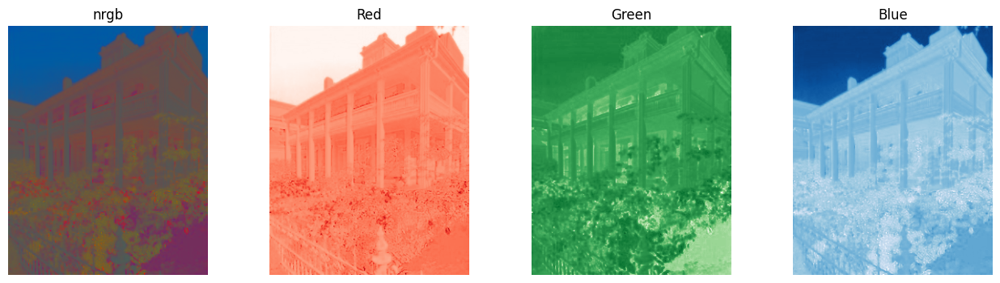

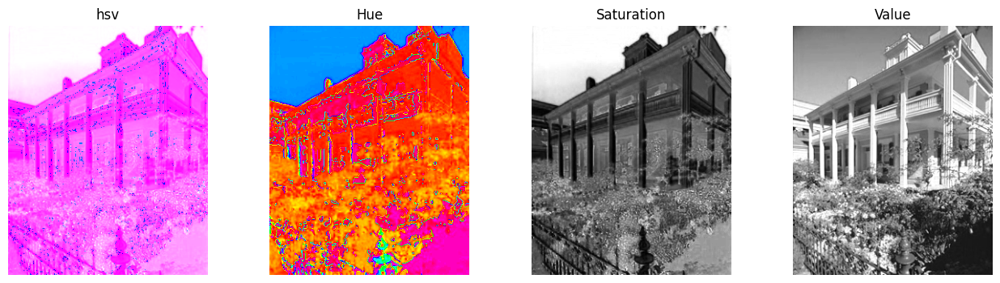

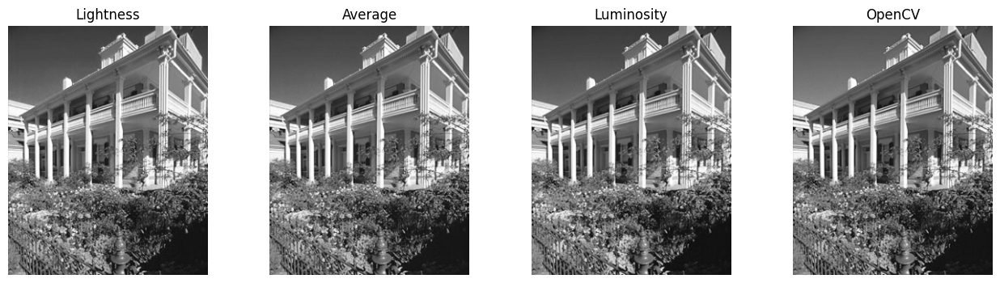

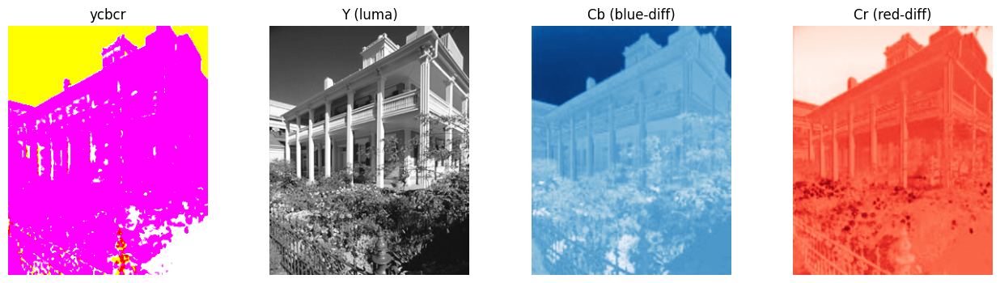

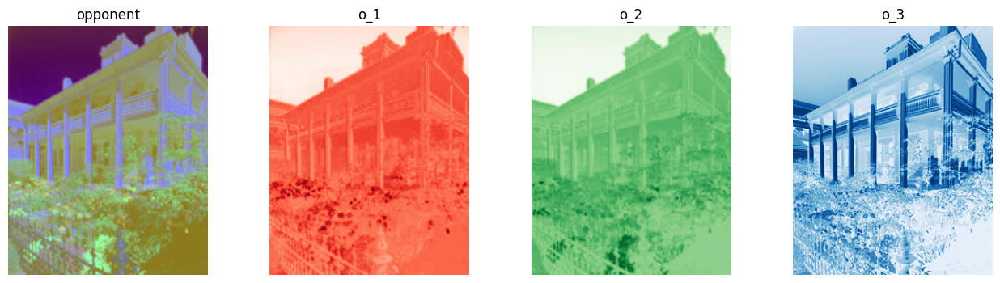

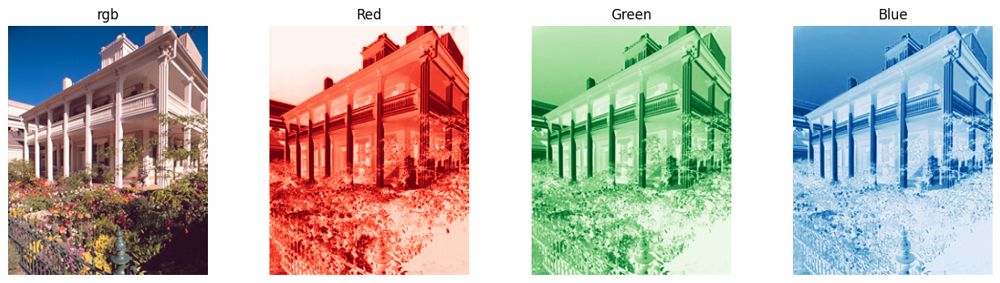

In [9]:
# Load and convert the image to RGB
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# YOUR CODE HERE
visualize_colourspace(image, 'nrgb')
visualize_colourspace(image, 'hsv')
visualize_colourspace(image, 'grays')
visualize_colourspace(image, 'ycbcr')
visualize_colourspace(image, 'opponent')
visualize_colourspace(image, 'rgb')

<a id="question-4"></a>
#### <font color='#FF0000'>Question 4 (2 points)</font>

Explain each of the above 5 colour spaces and their properties. What are the benefits of using a different colour space other than RGB? Provide reasons for each of the above cases. You can include your observations from the visualizations.

##### <font color='yellow'>Answer:</font>

> * Opponent Scale Space: models colour along perceptual axes (O1≈R−G, O2≈R+G−2B, O3≈R+G+B) to separate chromatic contrast from luminance; in my plots O1 clearly splits vegetation from the building while O3 behaves like a luminance map.
>   
> * Normalized RGB (rgb) Colour Space: divides each channel by R+G+B so brightness is removed and only chromaticity remains; useful for colour segmentation under changing illumination, and my nRGB rendering looks darker/flat as expected because intensity is discarded (channels get noisy in very dark areas).
>
> * HSV Colour Space: separates hue, saturation, and value which makes colour thresholding straightforward and less sensitive to shadows than RGB; in my results Hue separates sky/roof/foliage, Saturation highlights vivid flowers, and Value resembles a luminance/structure image.
>
> * YCbCr Colour Space: splits luma (Y) from chroma (Cb, Cr), enabling compression and processing brightness and colour separately; my Y channel matches grayscale closely while Cb and Cr emphasize blue/red regions with little structural detail.
>
> * Grayscale: can be computed by lightness, average, luminosity, or OpenCV; luminosity and OpenCV weight green more and preserve perceived contrast better.

<a id="question-5"></a>
#### <font color='#FF0000'>Question 5 (1 point)</font>

Find one more colour space from the literature, briefly explain its properties and give a use case.

##### <font color='yellow'>Answer:</font>

> CIELAB is a color space where L* is lightness and a*, b* capture red–green and blue–yellow. It’s designed so that distance between colors (ΔE) matches what we actually perceive, which makes it better than RGB/HSV for comparing colors. In practice you can check if two colors are “close enough” by testing ΔE against a threshold, or do clustering/segmentation by grouping points in a*–b* while using L* to deal with shadows.

<a id="section-2"></a>
### **Section 2: Colour Constancy**

Colour constancy is the ability to perceive the colors of objects consistently, regardless of the color of the light source. The goal of color constancy algorithms is to estimate the light source's illuminant and then correct the image so that it appears as if taken under a canonical (white) light source. In digital cameras, the automatic white balance (AWB) function performs this task to ensure images look natural.

In this part of the assignment, you will implement the well-known Grey-World Algorithm, a fundamental color constancy algorithm. This algorithm operates under the assumption that, under white light, the average color in a scene should be grey ([128, 128, 128]).

For more information, refer to the [Grey World algorithm on Wikipedia.](https://en.wikipedia.org/wiki/Color_normalization#Grey_world)

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (8 points)</font>

Complete the function `apply_grey_world_algorithm` to apply color correction to an RGB image using the Grey-World algorithm.

Display the original image and the color-corrected one on the same figure. Use the `beehive_house.jpg` image to test your algorithm. You should see that the reddish color cast on the image is removed, making it look more natural.

***Note:*** You do not need to apply any pre or post-processing steps. For the calculation or processing, you are not allowed to use any available code or any dedicated library function except *standard Numpy functions*.

In [10]:
def apply_grey_world_algorithm(awb_img):
    """
    Apply the Grey-World algorithm to correct the color balance of an RGB image.

    This function assumes that under a white light source, the average color in a scene should be grey.
    It corrects the image by scaling each channel so that the mean of each channel is equal.

    Args:
        awb_img: RGB image to be color corrected

    Returns:
        gw_img: Color corrected image using the Grey-World algorithm
    """

    # YOUR CODE HERE

    # convert to float for meaningfull divisions
    img_float = awb_img.astype(np.float32)
    
    means = np.mean(img_float, axis=(0, 1))

    scale_factors = np.mean(means) / means

    new_img = np.clip(img_float * scale_factors, 0, 255).astype(np.uint8)

    return new_img

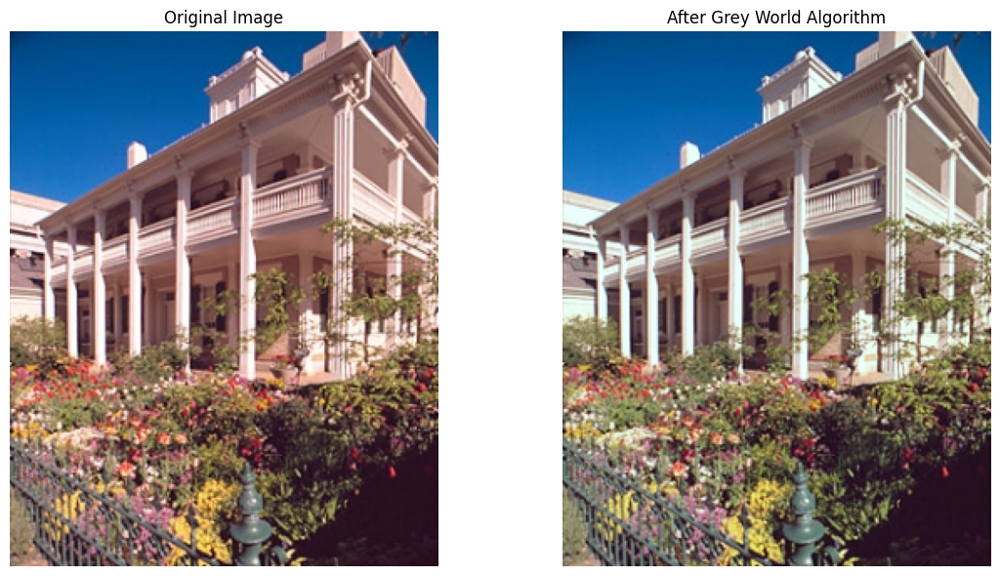

In [11]:
# load and convert the image to rgb
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# YOUR CODE HERE

new_img = apply_grey_world_algorithm(image)

# Plot side by side
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Original Image')
plt.axis('off')

# Normalized / White-balanced image
plt.subplot(1, 2, 2)
plt.imshow(new_img)
plt.title('After Grey World Algorithm')
plt.axis('off')

plt.tight_layout()
plt.show()

<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (2 points)</font>

Give an example case for Grey-World Algorithm on where it might fail. Include your reasoning.

##### <font color='yellow'>Answer:</font>

>Grey-World assumes the average scene colour is gray, so it breaks when that isn’t true or when illumination intensity/content changes. For example, a scene dominated by one colour (a green football field) or a sequence where brightness/new objects change over time will be miscorrected because the per-channel means no longer represent “gray.”

<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (3 points)</font>

Find out one more colour constancy algorithm from the literature and explain it briefly.

##### <font color='yellow'>Answer:</font>

> Shades-of-Gray (SoG): a simple colour-constancy method that generalizes Gray-World and Max-RGB using a Minkowski p-norm. You compute the per channel p-norm over the image and scale channels so these norms match, choosing p between 1 and ∞ trades off robustness to outliers. In practice it often beats plain Gray-World while staying lightweight. Source: Finlayson, G. D., & Trezzi, E. (2004, January). Shades of gray and colour constancy. In Color and imaging conference (Vol. 12, pp. 37-41). Society of Imaging Science and Technology.

<a id="section-3"></a>
### **Section 3: Intrinsic Image Decomposition**

Intrinsic image decomposition is the process of separating an image into its formation components, such as reflectance (albedo) and shading (illumination). <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1) Then, under the assumptions of body (diffuse) reflection, linear sensor response and narrow band filters, the decomposition of the observed image $I(\vec{x})$ at position $\vec{x}$ can be approximated as the element-wise product of its albedo $R(\vec{x})$ and shading $S(\vec{x})$ intrinsics:

$$I(\vec{x})=R(\vec{x}) \times S(\vec{x})$$

In this part of the assignment, you will experiment with intrinsic image components to perform a particular computational photography application: material recolouring. For the experiments, we will use images from a synthetic intrinsic image dataset. <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2)

<a name="cite_note-1"></a><small>[1.](#cite_ref-1) H. G. Barrow and J. M. Tenenbaum. Recovering intrinsic scene characteristics from images. Computer Vision Systems, pages 3-26, 1978.</small>

<a name="cite_note-2"></a><small>[2.](#cite_ref-1) http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/


<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (2 points)</font>

In what other components can an image be decomposed other than albedo and shading? Give an example and explain the concepts in your answer.

##### <font color='yellow'>Answer:</font>

> Beyond albedo and shading, images can be decomposed into surface orientation (normals) and depth (range), which describe the 3D shape, and a specular component to capture highlights separate from diffuse reflectance. For example, on a glossy statue with nearly uniform paint, the albedo is almost constant, the normals map shows the curved geometry, the depth map shows distance from the camera, shading explains brightness from lighting, and the specular layer isolates the shiny highlights.

<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (2 points)</font>

If you check the literature, you will see that almost all intrinsic image decomposition datasets are composed of synthetic images. What might be the reason for that?

##### <font color='yellow'>Answer:</font>

>Most datasets use synthetic images because in real photos it’s very hard to separate albedo and shading perfectly. You can’t easily measure how much of the brightness comes from the material versus the lighting. With synthetic images, everything is generated by a computer, so the ground truth values for albedo, shading, depth, etc. are known and available to us. This makes it much easier to create reliable datasets for training and evaluating intrinsic image decomposition methods.

<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (4 points)</font>

Choose an object with a single color from the `/intrinsic_images/` folder, which is based on the [synthetic intrinsic image dataset](http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/).

Demonstrate that you can reconstruct the original PNG image from its intrinsics using the albedo and shading. Your script should output a figure displaying the original image, its intrinsic images, and the reconstructed one. Complete the function `reconstruct_image_from_intrinsics()`.


In [12]:
def reconstruct_image_from_intrinsics(albedo_img, shading_img):
    """
    Reconstruct the original image from its intrinsic images (albedo and shading).

    This function takes the albedo and shading images as input, 
    and reconstructs the original image by multiplying albedo with shading.

    Args:
        albedo_img: Image representing the albedo (reflectance)
        shading_img: Image representing the shading

    Returns:
        iid_img: Reconstructed image
    """

    # YOUR CODE HERE 

    # print(albedo_img.max())
    # print(shading_img.max())

    # scale the shadow and albed to float 0, 1 if not done yet
    if albedo_img.max() > 1 :
        albedo_img = albedo_img.astype(np.float32) / 255.0
    else :
        albedo_img = albedo_img.astype(np.float32)

    if shading_img.max() > 1 :
        shading_img = shading_img.astype(np.float32) / 255.0
    else :
        shading_img = shading_img.astype(np.float32)

    # multiplt to get the reconstructed image
    iid_img = albedo_img * shading_img

    # rescale to 255 and clip any values bigger than 255 or smaller than 0
    iid_img = iid_img * 255.0
    iid_img = np.clip(iid_img, 0,255)

    # cast to uint again
    iid_img = iid_img.astype(np.uint8)

    return iid_img

object shape: (270, 480, 3)
object albedo shape: (270, 480, 3)
object shading shape: (270, 480, 3)


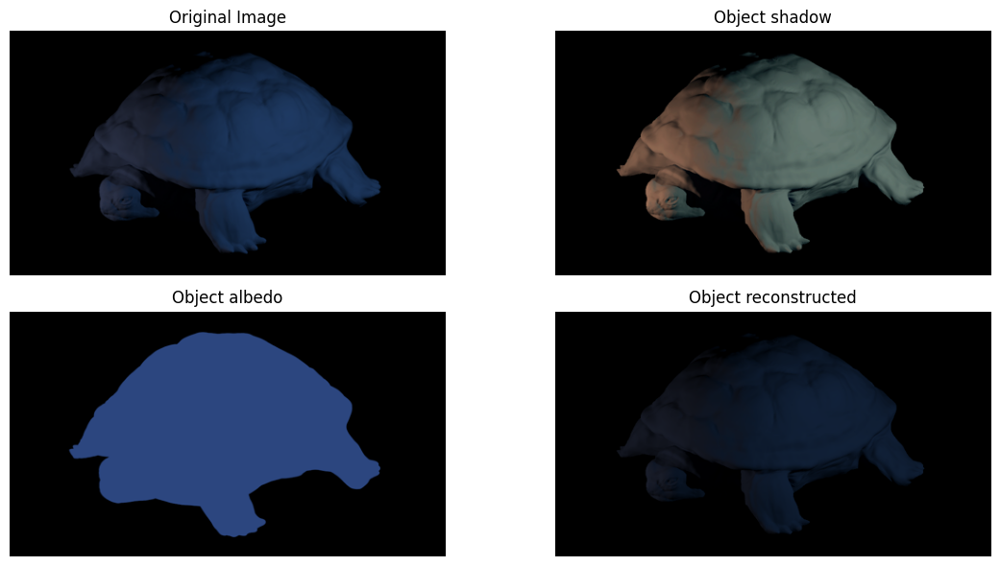

In [13]:
# Replace the object name with a valid name from the dataset
img_path = './intrinsic_images/'
object_name = 'turt_ml1'
#object_name = 'truck_sl'

# Read with opencv
obj = cv2.imread(img_path + object_name + '.png')
if obj is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + ".png"}')
else:
    print(f'object shape: {obj.shape}')

obj_sha = cv2.imread(img_path + object_name + '_shad.png')
if obj_sha is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + "_shad.png"}')
else:
    print(f'object albedo shape: {obj_sha.shape}')

obj_alb = cv2.imread(img_path + object_name.split('_')[0] + '_refl.png')
if obj_alb is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name.split("_")[0] + "_refl.png"}')
else:
    print(f'object shading shape: {obj_alb.shape}')

# YOUR CODE HERE

# Plot side by side
plt.figure(figsize=(12, 6))

# Original image
plt.subplot(2, 2, 1)
plt.imshow(obj)
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(obj_sha)
plt.title('Object shadow')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(obj_alb)
plt.title('Object albedo')
plt.axis('off')

plt.subplot(2, 2, 4)
obj_reconstructed = reconstruct_image_from_intrinsics(obj_alb, obj_sha)
plt.imshow(obj_reconstructed)
plt.title('Object reconstructed')
plt.axis('off')

plt.tight_layout()
plt.show()



<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (2 points)</font>

Manipulating colors in photographs is an important problem with many applications in computer vision. Recoloring algorithms aim to manipulate colors effectively, and better results can be obtained if the albedo image is available as it is independent of confounding illumination effects.

First determine the true material color of the object you picked in RGB space (uniform color in this case). 

- Complete the code for the function `get_true_color()`.
- Plot the true color of the object in RGB space, make sure to also plot each channel separately. 

**Hint:** You can use `np.tile` to create a visualization of the true color.

In [14]:
def get_true_color(albedo_img):
    """
    Determines the true material color of the object in the albedo image.

    This function calculates the average RGB color in the albedo image, which represents the true material color of the object.

    Args:
        albedo_img: Albedo (reflectance) image

    Returns:
        true_colour: True material color of the object in RGB space
    """

    # YOUR CODE HERE

    ## since we are doing the true color i do not need the black pixels of the albedo image
    non_black_mask = np.all(albedo_img != [0,0,0], axis=-1)

    # lets consider only non black pixels 
    albedo_img = albedo_img[non_black_mask]

    # get the mean of each pixel, clip to 0,255 and cast to int
    #  ( we have to do this bc the mean might have created some floats)
    true_colour = np.clip(np.mean(albedo_img, axis=(0)), 0, 255).astype(np.uint8)
    
    return true_colour

[125  68  43]


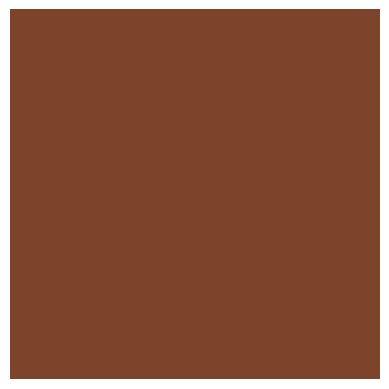

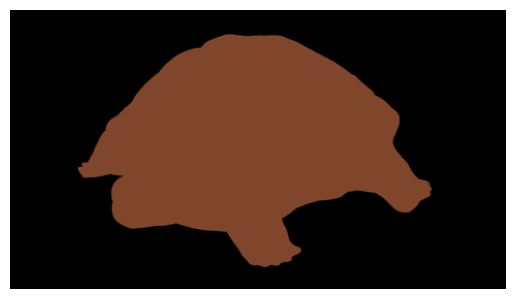

In [15]:
# get the true color of the object's albedo image
obj_alb_rgb = cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB)
true_color = get_true_color(obj_alb_rgb)

# YOUR CODE HERE

print(true_color)

plt.imshow([[(true_color[0], true_color[1], true_color[2])]])
plt.axis('off')
plt.show()

plt.imshow(obj_alb_rgb)
plt.axis('off')
plt.show()

<a id="question-13"></a>
#### <font color='#FF0000'>Question 13 (2 points)</font>

Assume you are given the PNG image and have access to its intrinsic albedo and shading images.

Recolor the object's image with pure red (255, 0, 0). Complete the code for the function `recolor_image()`. Display the recolored version of the object. Make sure to also plot each channel separately.

In [16]:
def recolor_image(albedo_img, shading_img):
    """
    Recolors an image based on its albedo and shading images.

    This function recolors the input albedo image by changing non-black pixels to red
    and then reconstructs the final image using the provided shading image.

    Args:
        albedo_img: Albedo (reflectance) image
        shading_img: Shading image

    Returns:
        recolored_img: Recolored and reconstructed image
    """

    # YOUR CODE HERE

    # where the albedo picture does not have black = where is the actual shape of the object
    # replace the color there with red = [255,0,0]
    albedo_img =np.where(np.all(albedo_img != [0, 0, 0], axis=-1, keepdims=True),
                               [255, 0, 0], albedo_img)

    # now returns the reconstructed image with new albedo color
    recolored_img = reconstruct_image_from_intrinsics(albedo_img, shading_img)

    return recolored_img

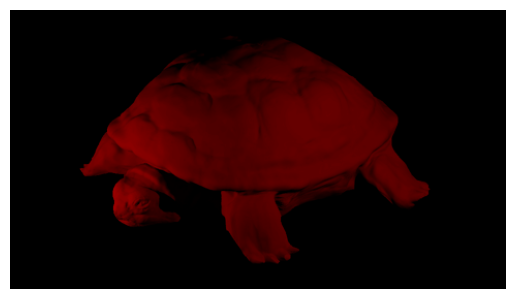

In [17]:
recolored_image = recolor_image(obj_alb, obj_sha)

# YOUR CODE HERE

plt.imshow(recolored_image)
plt.axis('off')
plt.show()

<a id="question-14"></a>
#### <font color='#FF0000'>Question 14 (2 points)</font>

Although you have recoloured the object with pure red, the reconstructed images do not seem to display those pure colors and thus the colour distributions over the object do not appear uniform. Explain the reason.

##### <font color='yellow'>Answer:</font>

The reconstructed image consists of the red albedo combined with the shading. Naturally, the shadows make some parts darker while the highlights make other parts brighter. Because of this, the reconstructed image does not appear uniformly red, which is essentially the intended outcome.

__Note:__  This was a simple case where the image is synthetic, object centered and has only one colour, and you have access to its ground-truth intrinsic images. Real world scenarios require more than just replacing a single colour with another, not to mention the complexity of achieving a decent intrinsic image decomposition.

<a id="section-4"></a>
### **Section 4: Photometric Stereo**

In this section, we delve into the photometric stereo technique, a method used to reconstruct a surface's shape from a set of images captured under varying lighting conditions. This approach is based on the principles outlined in Section 5.4 of Forsyth and Ponce's *Computer Vision: A Modern Approach*, which provides a comprehensive introduction to the theory and application of photometric stereo in computer vision.

Photometric stereo is particularly useful for capturing fine details of surface geometry. The core idea is to utilize an orthographic camera to take multiple images of a surface, each under different lighting conditions. By analyzing the variations in image intensity across these images, we can infer the surface normals and, subsequently, reconstruct the surface's height at each pixel, leading to what is commonly known as a height map or depth map.

The method assumes that the camera and the surface remain stationary, with illumination coming from different directions. By capturing enough images with different light source vectors, we can solve for the surface normals and albedo at each pixel.

<a id="question-15"></a>
#### <font color='#FF0000'>Question 15 (4 points)</font>

Start with the grayscale sphere model located in the SphereGray5 folder. The folder contains 5 images of a sphere with a grayscale checker texture under different lighting conditions. Your task is to estimate the surface reflectance (albedo) and surface normal of this model.

In this question, you will need to complete the function `estimate_albedo_and_normals()` to estimate the albedo and surface normal map for the SphereGray5 folder.

To assist you, two helper functions are provided:

- `load_synthetic_images()`: This function loads the synthetic images from the specified directory.
- `show_results()`: This function displays the albedo, surface normals, and optionally the height map and surface error.

These helper functions are provided to simplify the process of loading images and displaying your results.

**Hint**: To get the least-squares solution of a linear system, you can use the `numpy.linalg.lstsq` function.

Make sure to include images of your results in your notebook at key points. When visualizing 3D models, choose viewpoints that clearly illustrate the structure, and feel free to use multiple viewpoints if necessary.

In [18]:
def load_synthetic_images(image_dir='./photometrics_images/SphereGray5/', channel=0):
    """
    Loads synthetic images and their corresponding light source directions.

    This function reads all images from the specified directory, extracts the relevant channel, and stacks the images along the third dimension. It also extracts the light source directions from the image filenames and normalizes both the image stack and the light source vectors.

    Args:
        image_dir: directory containing the synthetic images
        channel: color channel to be extracted (default is 0, corresponding to the red channel)

    Returns:
        image_stack: a 3d numpy array of stacked images
        normalized_light_dirs: a 2d numpy array of normalized light source directions
    """
    # list all files in the image directory
    image_files = os.listdir(image_dir)
    num_images = len(image_files)

    image_stack = None
    light_directions = None
    
    # assumed z component for the light direction
    z_component = 0.5  

    # loop through all image files
    for i in range(num_images):
        # read the input image
        image = cv2.imread(os.path.join(image_dir, image_files[i]))
        image = np.flip(image, axis=-1)  # flip the image to correct the channel order
        image = image[:, :, channel]  # extract the specified color channel

        # initialize image stack and light direction array on the first iteration
        if image_stack is None:
            height, width = image.shape
            print('image size (h*w): %d*%d' % (height, width))
            image_stack = np.zeros([height, width, num_images], dtype=int)
            light_directions = np.zeros([num_images, 3], dtype=np.float64)

        # stack the image along the third dimension
        image_stack[:, :, i] = image

        # extract light direction from the image filename
        x_component = np.double(image_files[i][(image_files[i].find('_') + 1):image_files[i].rfind('_')])
        y_component = np.double(image_files[i][image_files[i].rfind('_') + 1:image_files[i].rfind('.png')])
        light_directions[i, :] = [x_component, -y_component, z_component]

    # convert the image stack to double precision for further processing
    image_stack = np.double(image_stack)

    # normalize the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)

    # handle the case where all pixel values are the same
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  

    # normalize the light direction vectors
    norm_factors = np.tile(np.sqrt(np.sum(light_directions ** 2, axis=1, keepdims=True)), (1, light_directions.shape[1]))
    normalized_light_dirs = light_directions / norm_factors

    return image_stack, normalized_light_dirs

In [ ]:
def show_results(albedo, normals, height_map=None, SE=None):
    """
    Displays the albedo, normals, and optionally the height map and surface error (SE).

    Args:
        albedo: albedo (reflectance) map
        normals: surface normal map
        height_map: reconstructed height map (optional)
        SE: surface error map (optional)
    """
    
    stride = 1

    if albedo is not None:
        # showing albedo map
        fig = plt.figure(figsize=(5, 5))
        albedo_max = 1  # normalize albedo values
        albedo = albedo / albedo_max
        print("Albedo shape:", albedo.shape)
        plt.imshow(albedo, cmap="gray")
        plt.title('Albedo Map', fontsize=16)
        plt.show()

    # showing normals as three separate channels
    figure = plt.figure(figsize=(10, 10))
    ax1 = figure.add_subplot(221)
    ax1.imshow(normals[..., 0], vmin=-1, vmax=1, cmap='viridis')
    ax1.set_axis_off()
    ax1.set_title('Normal Channel x', fontsize=16)
    ax2 = figure.add_subplot(222)
    ax2.imshow(normals[..., 1], vmin=-1, vmax=1, cmap='viridis')
    ax2.set_axis_off()
    ax2.set_title('Normal Channel y', fontsize=16)
    ax3 = figure.add_subplot(223)
    ax3.imshow(normals[..., 2], vmin=-1, vmax=1, cmap='viridis')
    ax3.set_axis_off()
    ax3.set_title('Normal Channel z', fontsize=16)
    ax4 = figure.add_subplot(224)
    ax4.imshow((normals + 1) * 0.5)
    ax4.set_axis_off()
    ax4.set_title('Combined Normals', fontsize=16)
    plt.show()

    # Create meshgrid for plotting 3D surfaces
    X, Y, _ = np.meshgrid(np.arange(0, np.shape(normals)[0], stride),
                          np.arange(0, np.shape(normals)[1], stride),
                          np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]

    # Show both heightmap and SE in a 1x2 subplot if they're available
    if height_map is not None and SE is not None:
        fig = plt.figure(figsize=(8, 4))

        # Show heightmap
        ax1 = fig.add_subplot(1, 2, 1, projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax1.plot_surface(X, Y, H_height_map.T)
        ax1.set_title("Height Map")

        # Show SE
        ax2 = fig.add_subplot(1, 2, 2, projection='3d')
        H_SE = SE[::stride, ::stride]
        ax2.plot_surface(X, Y, H_SE.T, color='r')
        ax2.set_title("SE")

        plt.tight_layout()
        plt.show()

    # Only show heightmap if it's available
    elif height_map is not None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax.plot_surface(X, Y, H_height_map.T)
        ax.set_title("Height Map")
        plt.show()

    # Only show SE if it's available
    elif SE is not None:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_SE = SE[::stride, ::stride]
        ax.plot_surface(X, Y, H_SE.T, color='r')
        ax.set_title("SE")
        plt.show()

Following the guidelines in *Computer Vision: A Modern Approach* by Forsyth and Ponce, Chapter 5, Section 5.4, you will complete the `estimate_albedo_and_normals()` function by implementing the following steps:

1. **Iterate through each point in the image array**:
   - For each pixel, extract the intensity values across all images and stack them into a vector `i`.

2. **Construct the diagonal matrix**:
   - Construct the diagonal matrix `scriptI` using the vector `i`.

3. **Solve the linear system**:
   - Solve the equation `scriptI * scriptV * g = scriptI * i` to obtain the vector `g` for each pixel.

4. **Compute the albedo**:
   - The albedo at each pixel is the magnitude (norm) of the vector `g`, denoted as `|g|`.

5. **Compute the surface normal**:
   - The surface normal at each pixel is given by `g / |g|`, where `|g|` is non-zero.

In [20]:
def estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True):
    """
    Estimates the surface albedo and normals from a stack of images.

    This function computes the albedo and surface normals for each pixel in the 
    image stack using the provided light source directions. Optionally, it applies 
    the shadow trick to improve the robustness of the solution.

    Args:
        image_stack: The stack of images of the surface, stacked along the third dimension.
        scriptV: The matrix containing the source and camera information.
        shadow_trick: Boolean indicating whether to use the shadow trick (default is True).

    Returns:
        albedo: The estimated surface albedo.
        normal: The estimated surface normals.
    """

    h, w, _ = image_stack.shape

    # create arrays for the albedo and normals
    albedo = np.zeros([h, w])
    normal = np.zeros([h, w, 3])

    # YOUR CODE HERE
    # number of images
    m = image_stack.shape[2]

    for y in range(h):
        for x in range(w):
            # 1) stack intensities across all images → i (M,)
            i = image_stack[y, x, :].astype(np.float64)

            # skip pure shadow/background pixels
            if not np.any(i):
                continue

            if shadow_trick:
                # 2) "diagonal" weighting with i  (diag(i) @ V) and (diag(i) @ i)
                #    implemented via elementwise multiplication (no explicit diag)
                A = i[:, None] * scriptV          # (M,3)
                b = i * i                          # (M,)
            else:
                # unweighted system V g = i
                A = scriptV                        # (M,3)
                b = i                              # (M,)

            # 3) solve least-squares for g
            g, *_ = np.linalg.lstsq(A, b, rcond=None)  # g ∈ R^3

            # 4) albedo = |g|
            rho = np.linalg.norm(g)

            # 5) normal = g / |g|  (guard zero)
            if rho > 1e-12:
                albedo[y, x] = rho
                normal[y, x, :] = g / rho

    return albedo, normal

image size (h*w): 512*512
Albedo shape: (512, 512)


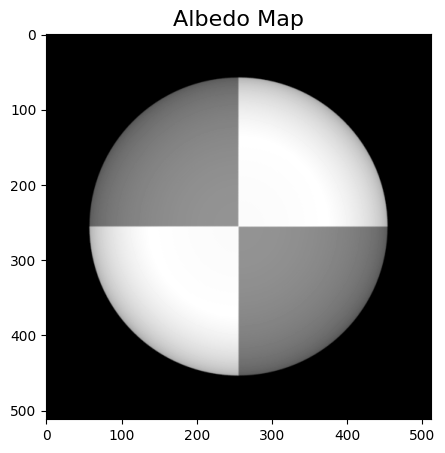

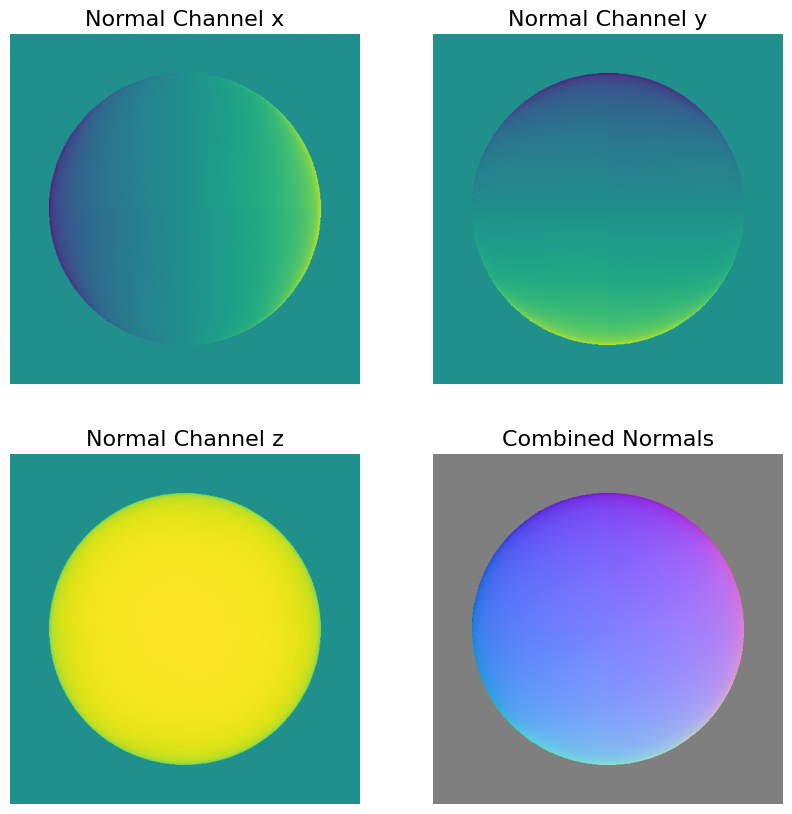

In [21]:
# load synthetic images for SphereGray5
# YOUR CODE HERE
image_stack, light_dirs = load_synthetic_images('./photometrics_images/SphereGray5/', channel=0)
# estimate albedo and normals
# YOUR CODE HERE
albedo, normals = estimate_albedo_and_normals(image_stack, light_dirs, shadow_trick=True)


# show results
# YOUR CODE HERE
show_results(albedo, normals)

In [ ]:

np.set_printoptions(precision=6, suppress=True, linewidth=200)

mask = albedo > 0
print("valid pixels:", mask.sum(), "/", mask.size)

# pick a valid pixel near the center
ys, xs = np.where(mask)
yc, xc = ys[len(ys)//2], xs[len(xs)//2]
print("normal at center-ish:", normals[yc, xc])

# show a small neighborhood with more precision
print("nx patch:\n", normals[yc-2:yc+3, xc-2:xc+3, 0])
print("ny patch:\n", normals[yc-2:yc+3, xc-2:xc+3, 1])
print("nz patch:\n", normals[yc-2:yc+3, xc-2:xc+3, 2])

# channel stats inside the sphere
for k, name in enumerate("xyz"):
    vals = normals[..., k][mask]
    print(f"n_{name}: min={vals.min():.4f} max={vals.max():.4f} mean={vals.mean():.4f}")

# check unit-length
norm_len = np.linalg.norm(normals, axis=2)
print("||n|| mean:", norm_len[mask].mean(), "  std:", norm_len[mask].std())


valid pixels: 124449 / 262144
normal at center-ish: [-0.747073  0.        0.664742]
nx patch:
 [[ 0.       -0.83957  -0.757609 -0.707107 -0.664188]
 [ 0.       -0.825307 -0.749554 -0.700297 -0.666538]
 [ 0.       -0.789523 -0.747073 -0.702927 -0.671514]
 [ 0.       -0.802043 -0.751931 -0.705099 -0.673121]
 [ 0.       -0.803808 -0.752662 -0.703063 -0.673121]]
ny patch:
 [[ 0.        0.        0.        0.       -0.007576]
 [ 0.        0.        0.        0.        0.      ]
 [ 0.        0.013535  0.        0.        0.004086]
 [ 0.        0.        0.004414  0.003999  0.003906]
 [ 0.        0.013939  0.004489  0.00802   0.003906]]
nz patch:
 [[0.       0.543251 0.652709 0.707107 0.747527]
 [0.       0.564684 0.661944 0.713851 0.745471]
 [0.       0.613572 0.664742 0.711262 0.740981]
 [0.       0.597266 0.659227 0.709098 0.739522]
 [0.       0.594725 0.658392 0.711083 0.739522]]
n_x: min=-0.8742 max=0.8901 mean=-0.0000
n_y: min=-0.9091 max=0.9091 mean=0.0000
n_z: min=0.3621 max=1.0000 me

<a id="question-16"></a>
#### <font color='#FF0000'>Question 16 (2 points)</font>

After implementing the `estimate_albedo_and_normals()` function, what do you expect to see in the albedo image? How does this compare to your actual result? Explain the differences.

##### <font color='yellow'>Answer:</font>

For the albedo image I expected a clean, illumination-invariant material map: four uniform gray quadrants on the sphere with a sharp circular boundary and a black background. In my result the quadrants are there, but I see a slight radial gradient, a faint vertical/horizontal seam, and some darkening near the rim. This mismatch is likely from using only five lights (weakly constrained least squares), shadows and near-grazing angles where nz is small, plus minor calibration issues (assumed light z, per-image gain/gamma) and the global min–max normalization. Using more lights (SphereGray25), masking very dark/bright pixels, and a more robust fit typically makes the albedo flatter and closer to the ideal.


<a id="question-17"></a>
#### <font color='#FF0000'>Question 17 (1 point)</font>

In principle, what is the minimum number of images you need to estimate the albedo and surface normal? Explain your reasoning.

##### <font color='yellow'>Answer:</font>

Three images, as long as the three light directions are linearly independent (full-rank V). At each pixel we solve V g = i for the 3 unknowns in g = ρ n (the albedo–normal product). With only two images we have infinitely many solutions; with three independent lights you can uniquely recover g, then take |g| for albedo and g/|g| for the normal. In practice we use more than three to handle noise, shadows, and non-Lambertian effects, but the theoretical minimum is three well-calibrated, non-coplanar lighting directions.



<a id="question-18"></a>
#### <font color='#FF0000'>Question 18 (2 points)</font>

Now, run the algorithm with more images by using the SphereGray25 folder. Observe the differences in the results when using more images. Report your findings. 

You could try all images at once or a few at a time, incrementally. Choose a strategy and justify it by discussing your results.

image size (h*w): 512*512
Albedo shape: (512, 512)


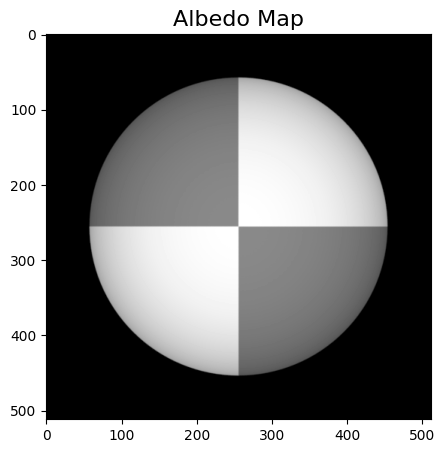

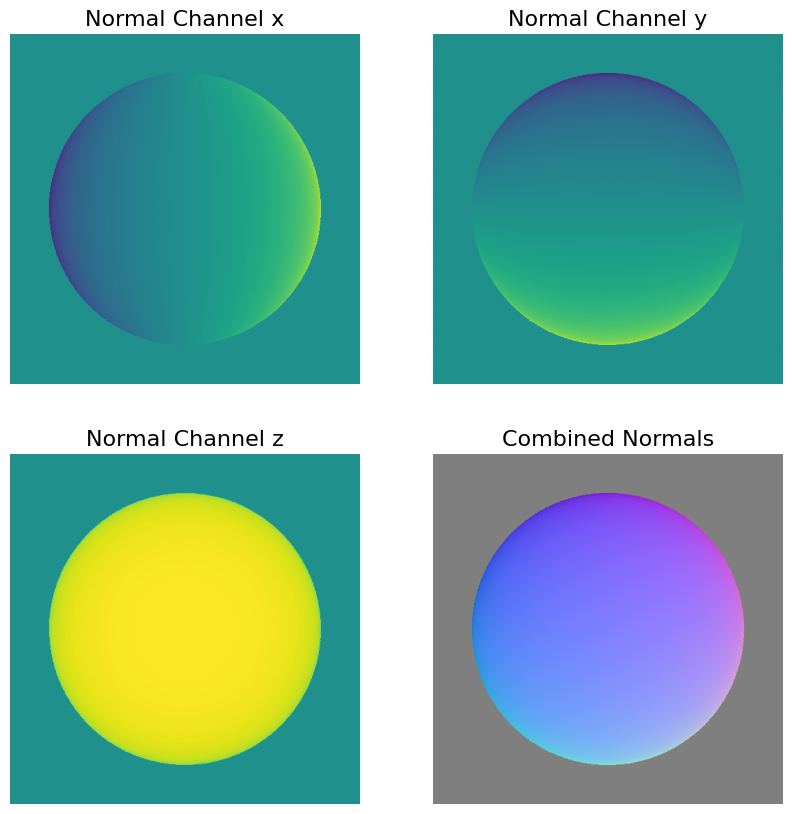

In [23]:
# load synthetic images for SphereGray25
# YOUR CODE HERE
image_stack_25, light_dirs_25 = load_synthetic_images('./photometrics_images/SphereGray25/', channel=0)

# estimate albedo and normals for SphereGray25
# YOUR CODE HERE
albedo_s25, normals_s25 = estimate_albedo_and_normals(image_stack_25, light_dirs_25, shadow_trick=True)

# show the results for SphereGray25
# YOUR CODE HERE
show_results(albedo_s25, normals_s25)


##### <font color='yellow'>Answer:</font>

With 25 lights the results are clearly cleaner than with 5. The albedo quadrants look flatter with far less radial drift and the cross-seam is barely visible. The normal channels show smoother left-right/top-bottom gradients and the rim is less noisy (nz drops more gently), so the combined normal looks more uniform. Integrability typically improves too (fewer SE spikes and a steadier height map). I’d report this via an incremental run (5→10→15→25): big gains up to ~15 lights, then diminishing returns, lighting diversity matters more than just count.>*Write your answer here.*

<a id="question-19"></a>
#### <font color='#FF0000'>Question 19 (2 points)</font>

Consider the impact of shadows in photometric stereo. Explain the trick mentioned in the textbook to deal with shadows.

Remove this trick from your implementation and check your results. Is the trick necessary when using 5 images? How about when using 25 images?

image size (h*w): 512*512
image size (h*w): 512*512
SphereGray5 — no shadow trick
Albedo shape: (512, 512)


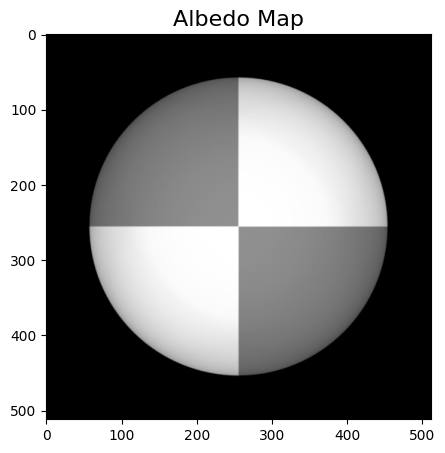

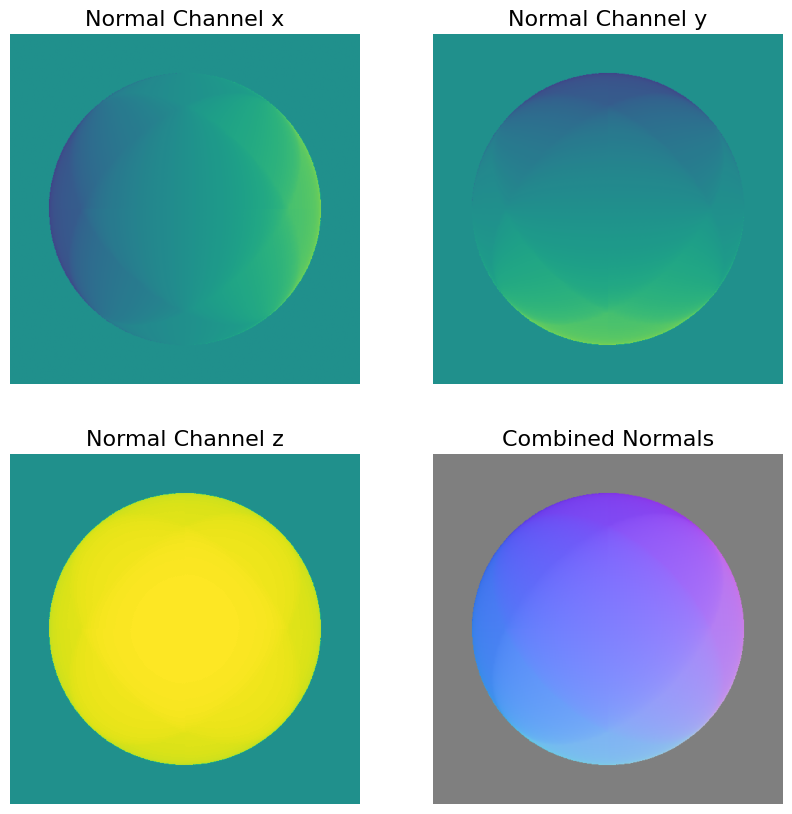

SphereGray25 — no shadow trick
Albedo shape: (512, 512)


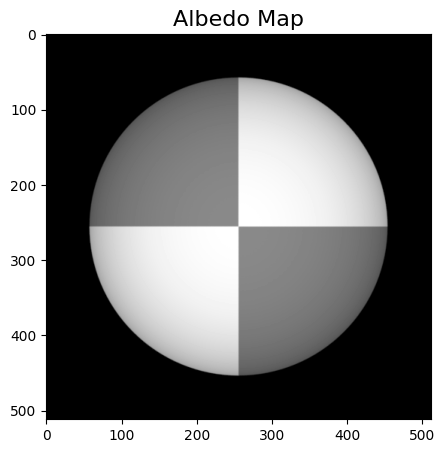

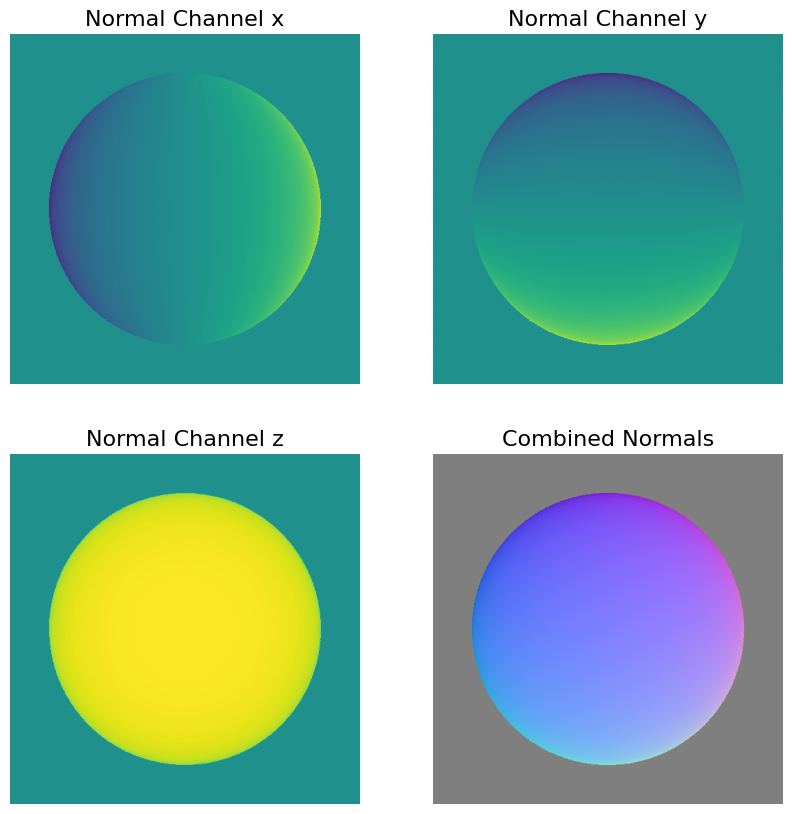

In [24]:
# load synthetic images for SphereGray5 and SphereGray25
# YOUR CODE HERE
image_stack_5, light_dirs_5   = load_synthetic_images('./photometrics_images/SphereGray5/',  channel=0)

image_stack_25, light_dirs_25 = load_synthetic_images('./photometrics_images/SphereGray25/', channel=0)

# estimate albedo and normals without shadow trick
# YOUR CODE HERE
albedo_s5,  normals_s5  = estimate_albedo_and_normals(image_stack_5,  light_dirs_5,  shadow_trick=False)

albedo_25, normals_25 = estimate_albedo_and_normals(image_stack_25, light_dirs_25, shadow_trick=True)

# show results without shadow trick
# YOUR CODE HERE
print("SphereGray5 — no shadow trick")
show_results(albedo_s5, normals_s5)
print("SphereGray25 — no shadow trick")
show_results(albedo_25, normals_25)


##### <font color='yellow'>Answer:</font>


The results with 5 lights show that the the shadow trick clearly helps because without it we get slight banding and bigger SE spikes near the rim (silhouette shadows), and the height bowl looks a bit wavy. Once we weight by intensity, those artifacts shrink and, the normals get smoother and SE drops.

When using 25 lights, the difference is smaller because the extra views already average out bad rows, but the trick still knocks down residual spikes at the boundary and around the dim side. So,it is nott strictly necessary at K=25, but it’s still safer to keep it; at K=5 it’s pretty important.


<a id="question-20"></a>
#### <font color='#FF0000'>Question 20 (5 points)</font>

Before reconstructing the surface height map, it is necessary to compute the partial derivatives, $\frac{\partial f}{\partial x}$ and $\frac{\partial f}{\partial y}$ (referred to as *p* and *q* in the algorithm). These partial derivatives also allow for a double-check of the computation through a test of *integrability*.

In this question, you will need to complete the function `check_integrability()` to compute the partial derivatives *p* and *q*.

Make sure to verify your results by examining the integrability of the computed derivatives.

In [25]:
def check_integrability(normals):
    """
    Checks the surface gradient for integrability.

    This function computes the partial derivatives of the surface function with respect to x and y 
    (p and q), and calculates the squared errors of the mixed partial derivatives to test for integrability.

    Args:
        normals: The normal map of the surface.

    Returns:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        SE: The squared errors of the mixed partial derivatives.
    """

    # initialize p, q, and SE
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])

    # YOUR CODE HERE

# safe denominator to avoid divide-by-zero
    nz = normals[:, :, 2]
    nz_safe = np.where(np.abs(nz) < 1e-12, 1e-12, nz)

    # compute p and q
    p = normals[:, :, 0] / nz_safe   # df/dx
    q = normals[:, :, 1] / nz_safe   # df/dy

    # gradients: np.gradient returns (∂/∂y, ∂/∂x)
    dp_dy, dp_dx = np.gradient(p)
    dq_dy, dq_dx = np.gradient(q)

    # squared error of integrability condition (∂p/∂y ≈ ∂q/∂x)
    SE = (dp_dy - dq_dx) ** 2


    return p, q, SE

In [26]:
#YOUR CODE HERE
# 5 lights
p5, q5, SE5 = check_integrability(normals_s5)
print('5 lights -> SE max:', np.nanmax(SE5))
mask5 = (albedo_s5 > 0) & (normals_s5[...,2] > 0.1)
print('5 lights mean/median/p95, %>μ+2σ:',
      np.nanmean(SE5[mask5]), np.nanmedian(SE5[mask5]),
      np.nanpercentile(SE5[mask5], 95),
      np.mean(SE5[mask5] > (np.nanmean(SE5[mask5]) + 2*np.nanstd(SE5[mask5]))))

# 25 lights
p25, q25, SE25 = check_integrability(normals_s25)
print('25 lights -> SE max:', np.nanmax(SE25))
mask25 = (albedo_s25 > 0) & (normals_s25[...,2] > 0.1)
print('25 lights mean/median/p95, %>μ+2σ:',
      np.nanmean(SE25[mask25]), np.nanmedian(SE25[mask25]),
      np.nanpercentile(SE25[mask25], 95),
      np.mean(SE25[mask25] > (np.nanmean(SE25[mask25]) + 2*np.nanstd(SE25[mask25]))))


5 lights -> SE max: 0.29038929411821196
5 lights mean/median/p95, %>μ+2σ: 0.0002994204911434443 5.189873081452303e-07 2.8394839373223484e-05 0.00548015652998417
25 lights -> SE max: 0.8672454889034573
25 lights mean/median/p95, %>μ+2σ: 0.0005905556303393415 1.9159409271354617e-07 6.170294535921266e-06 0.005423908589060579


<a id="question-21"></a>
#### <font color='#FF0000'>Question 21 (3 points)</font>

Implement and compute the partial derivatives according to the provided algorithm, and perform the test of integrability by applying a reasonable threshold to the squared errors. 

Reflect on the potential causes of any errors observed. Additionally, analyze how the test of integrability performs when using the GraySphere5 and GraySphere25 datasets. Use the normal maps obtained from the previous steps with the shadow trick applied.

SphereGray5:
  SE max = 0.032748
  mean/median/p95 = 2.787502e-05 / 5.103408e-07 / 2.132776e-05
  outlier % (> μ+2σ) = 0.46%
SphereGray25:
  SE max = 0.212876
  mean/median/p95 = 1.155984e-05 / 1.867826e-07 / 5.162521e-06
  outlier % (> μ+2σ) = 0.09%


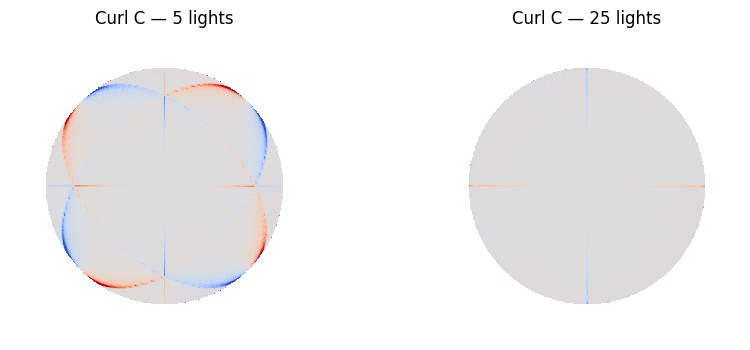

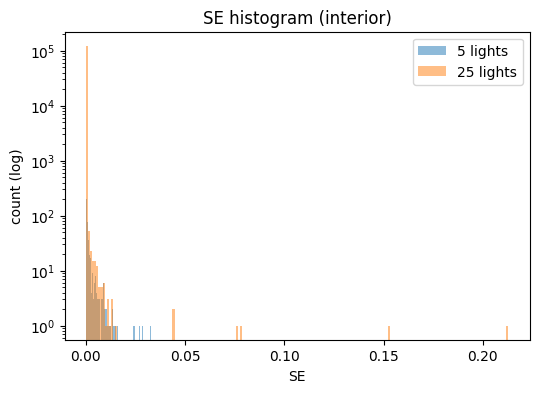

In [ ]:

#YOUR CODE HERE
def check_integrability(normals):
    p = np.zeros(normals.shape[:2]); q = np.zeros_like(p); SE = np.zeros_like(p)
    nx, ny, nz = normals[...,0], normals[...,1], normals[...,2]
    p[:] = np.nan; q[:] = np.nan; SE[:] = np.nan
    valid = np.abs(nz) > 1e-8
    p[valid] = nx[valid]/nz[valid]
    q[valid] = ny[valid]/nz[valid]
    dp_dy, _ = np.gradient(p); _, dq_dx = np.gradient(q)
    C  = dp_dy - dq_dx          # signed curl
    SE = C**2
    return p, q, C, SE

def integrability_deep_dive(normals, albedo=None, label=""):
    _, _, C, SE = check_integrability(normals)
    mask = np.isfinite(SE) & (normals[...,2] > 0.15)
    if albedo is not None:
        mask &= (albedo > 0)
    mu, sig = np.nanmean(SE[mask]), np.nanstd(SE[mask])
    thr = mu + 2*sig
    stats = dict(
        label=label,
        SE_max=float(np.nanmax(SE)),
        mean=float(mu),
        median=float(np.nanmedian(SE[mask])),
        p95=float(np.nanpercentile(SE[mask],95)),
        outlier_pct=float(100*np.mean(SE[mask] > thr)),
        C=C, SE=SE, mask=mask,
        vlim=float(np.nanpercentile(np.abs(C[mask]), 99))  # for common scale
    )
    print(f"{label}:\n  SE max = {stats['SE_max']:.6f}"
          f"\n  mean/median/p95 = {stats['mean']:.6e} / {stats['median']:.6e} / {stats['p95']:.6e}"
          f"\n  outlier % (> μ+2σ) = {stats['outlier_pct']:.2f}%")
    return stats

# Run for both datasets 
s5  = integrability_deep_dive(normals_s5,  albedo_s5,  "SphereGray5")
s25 = integrability_deep_dive(normals_s25, albedo_s25, "SphereGray25")

# Side-by-side curl maps with the SAME color scale
v = max(s5['vlim'], s25['vlim'])
fig, axs = plt.subplots(1,2, figsize=(10,4))
axs[0].imshow(s5['C'],  cmap='coolwarm', vmin=-v, vmax= v);  axs[0].set_title("Curl C — 5 lights");  axs[0].axis('off')
axs[1].imshow(s25['C'], cmap='coolwarm', vmin=-v, vmax= v);  axs[1].set_title("Curl C — 25 lights"); axs[1].axis('off')
plt.show()

# Optional: histograms of SE on the interior mask
plt.figure(figsize=(6,4))
plt.hist(s5['SE'][s5['mask']].ravel(),  bins=200, alpha=0.5, label='5 lights',  log=True)
plt.hist(s25['SE'][s25['mask']].ravel(), bins=200, alpha=0.5, label='25 lights', log=True)
plt.xlabel('SE'); plt.ylabel('count (log)'); plt.legend(); plt.title('SE histogram (interior)'); plt.show()


##### <font color='yellow'>Answer:</font>

With 25 lights the field is much more integrable overall. For SphereGray5 I get SE max ≈ 0.0327, mean/median/p95 ≈ 2.79e-05 / 5.10e-07 / 2.13e-05, and about 0.46% outliers (> μ+2σ). With SphereGray25 the bulk errors drop: SE max is higher at 0.2129 (a few spikes), but mean/median/p95 shrink to 1.16e-05 / 1.87e-07 / 5.16e-06 and outliers fall to 0.09%.

The curl plots tell the same story. With 5 lights there are clear red/blue lobes near the rim, showing path dependence in the integration. With 25 lights the curl is near zero almost everywhere, just thin seams at the silhouette. So despite a handful of larger spikes inflating the max, the 25-light set is more self-consistent and gives a stabler reconstruction for most pixels.

<a id="question-22"></a>
#### <font color='#FF0000'>Question 22 (6 points)</font>

To reconstruct the surface height map, you need to integrate the partial derivatives over a path. Since we are working with discrete structures, this integration is done by summing their values.

The algorithm presented in the chapter suggests performing the integration in a column-major order: start at the top-left corner, integrate along the first column, and then proceed to the right along each row. However, it is also recommended to use multiple paths and average the results to help distribute the errors from derivative estimates.

In this question, you will:

1. Construct the surface height map using column-major order as described in the algorithm.
2. Implement the row-major path integration method.

Your implementation should be added to the `construct_surface()` function.

**Note**: By default, Numpy uses row-major operations. If you unroll an image to linearize the operation, you will end up with a row-major representation. Numpy can be configured to use column-major order, but this concern does not apply if you are using double for-loops without unrolling.

**Hint**: To further inspect the shape of the objects and normal directions, consider using the `matplotlib.pyplot.quiver` function. Be sure to choose appropriate sub-sampling ratios for proper illustration. Add this to the `show_results()` function if needed.

In [28]:
def construct_surface(p, q, path_type='column'):
    """
    Constructs the surface function represented as height_map.

    This function integrates the partial derivatives p and q to reconstruct the surface height map.
    The integration can be done along a column-major, row-major, or an averaged path.

    Args:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        path_type: The type of path to construct the height_map, either 'column', 'row', or 'average'.

    Returns:
        height_map: The reconstructed surface height map.
    """

    h, w = p.shape
    height_map = np.zeros([h, w])

    if path_type == 'column':
        # YOUR CODE HERE
        for y in range(1, h):
            height_map[y, 0] = height_map[y-1, 0] + q[y-1, 0]
    # then integrate along each row using p (left → right)
        for y in range(h):
            for x in range(1, w):
                height_map[y, x] = height_map[y, x-1] + p[y, x-1]

    elif path_type == 'row':
        # YOUR CODE HERE
        for x in range(1, w):
            height_map[0, x] = height_map[0, x-1] + p[0, x-1]
        # then integrate down each column using q (top → bottom)
        for x in range(w):
            for y in range(1, h):
                height_map[y, x] = height_map[y-1, x] + q[y-1, x]

    elif path_type == 'average':
        # YOUR CODE HERE
      
        Hc = construct_surface(p, q, path_type='column')
        Hr = construct_surface(p, q, path_type='row')
        height_map = 0.5 * (Hc + Hr)

    return height_map

SphereGray5 — integrability:
  SE max = 0.290389
  mean/median/p95 = 2.994205e-04 / 5.189873e-07 / 2.839484e-05
  outlier % (> μ+2σ) = 0.26%


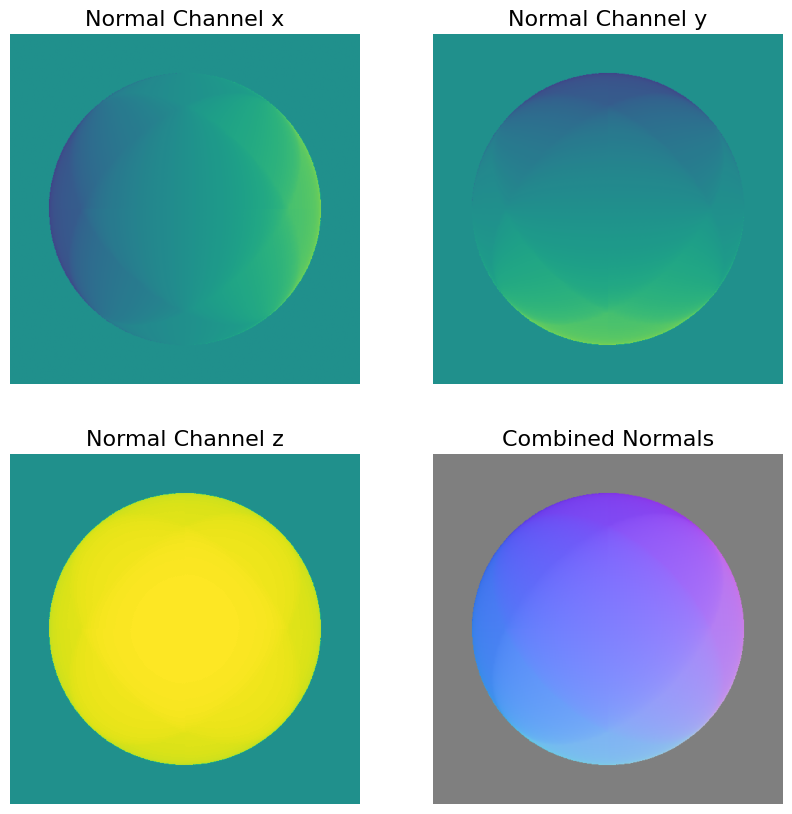

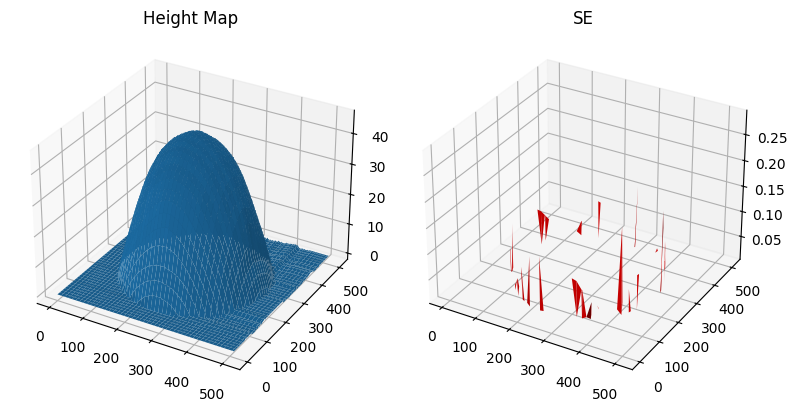

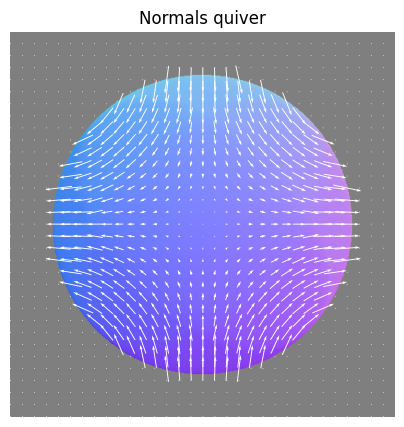


SphereGray25 — integrability:
  SE max = 0.867245
  mean/median/p95 = 5.905556e-04 / 1.915941e-07 / 6.170295e-06
  outlier % (> μ+2σ) = 0.26%


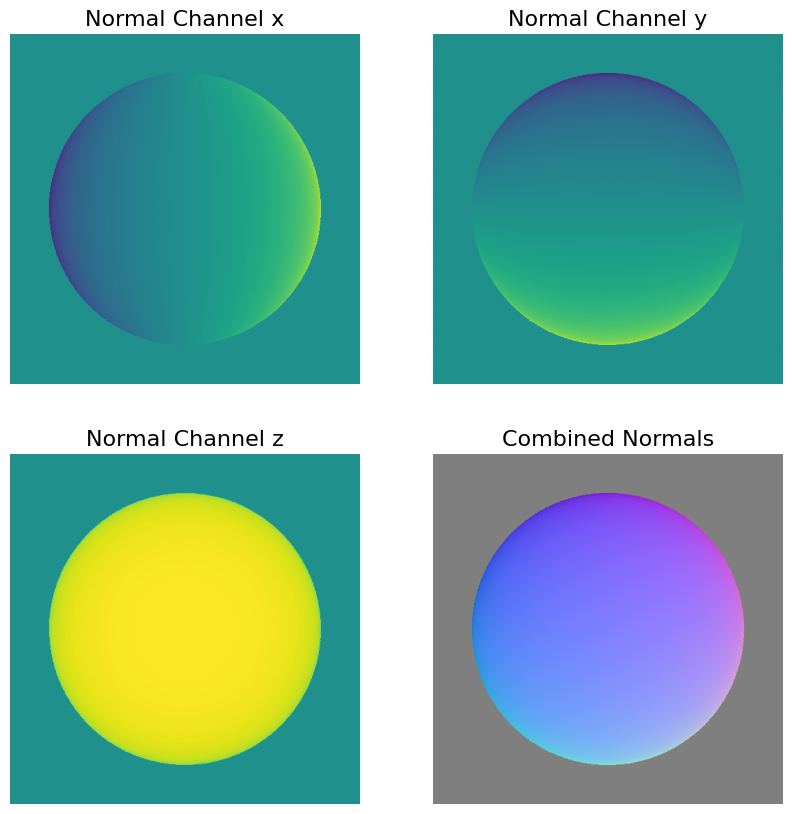

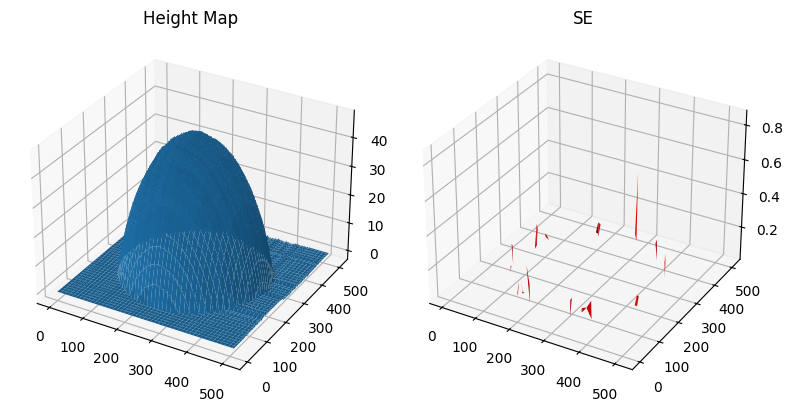

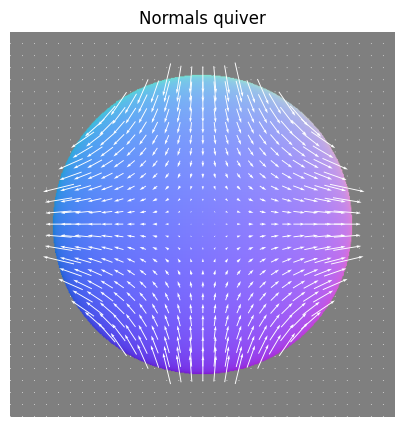

In [29]:

def check_integrability(normals):
    """
    Compute p=df/dx and q=df/dy from the normal map, then the squared curl error SE.
    NOTE: keep the given initializations unchanged.
    """
    # initialize p, q, and SE  (do not change these three lines)
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])

    nx = normals[..., 0]    
    ny = normals[..., 1]
    nz = normals[..., 2]

    # safe division (avoid nz ~ 0)
    eps = 1e-8
    valid = np.abs(nz) > eps

    # Geometric relation  n ∝ (-p, -q, 1)  =>  p = -nx/nz, q = -ny/nz
    with np.errstate(divide='ignore', invalid='ignore'):
        p[valid] = -nx[valid] / nz[valid]
        q[valid] = -ny[valid] / nz[valid]

    # mixed partials consistency: (∂p/∂y) ≈ (∂q/∂x)
    dp_dy = np.gradient(p, axis=0)
    dq_dx = np.gradient(q, axis=1)
    SE = (dp_dy - dq_dx) ** 2
    SE[~valid] = np.nan  # ignore invalid pixels in stats/plots

    return p, q, SE





# add a quiver overlay to visualize normals direction 

def show_normals_quiver(normals, step=12, over='combined'):
    """
    Quick quiver visualization of the normals’ (nx, ny) on top of an image.
    over: 'combined' (RGB normal) or 'nz' (z-channel) backdrop.
    """
    H, W = normals.shape[:2]
    backdrop = (normals + 1) * 0.5 if over == 'combined' else normals[..., 2]
    U = normals[::step, ::step, 0]
    V = -normals[::step, ::step, 1]  # flip Y for image coords
    X, Y = np.meshgrid(np.arange(0, W, step), np.arange(0, H, step))

    plt.figure(figsize=(5, 5))
    plt.imshow(backdrop)
    plt.quiver(X, Y, U, V, color='w', pivot='mid', angles='xy',
               scale_units='xy', scale=None, linewidth=0.5)
    plt.title('Normals quiver')
    plt.axis('off')
    plt.gca().invert_yaxis()
    plt.show()




# 5 lights
p5, q5, SE5 = check_integrability(normals_s5)
thr5 = np.nanmean(SE5) + 2*np.nanstd(SE5)
SE5_viz = SE5.copy(); SE5_viz[SE5_viz <= thr5] = np.nan

H5_col = construct_surface(p5, q5, 'column')
H5_row = construct_surface(p5, q5, 'row')
H5_avg = construct_surface(p5, q5, 'average')

print('SphereGray5 — integrability:')
print(f'  SE max = {np.nanmax(SE5):.6f}')
print(f'  mean/median/p95 = {np.nanmean(SE5):.6e} / {np.nanmedian(SE5):.6e} / {np.nanpercentile(SE5,95):.6e}')
print(f'  outlier % (> μ+2σ) = {100.0*np.nanmean(SE5 > thr5):.2f}%')

show_results(None, normals_s5, H5_avg, SE5_viz)
# optional arrows
show_normals_quiver(normals_s5, step=16)

# 25 lights
p25, q25, SE25 = check_integrability(normals_s25)
thr25 = np.nanmean(SE25) + 2*np.nanstd(SE25)
SE25_viz = SE25.copy(); SE25_viz[SE25_viz <= thr25] = np.nan

H25_avg = construct_surface(p25, q25, 'average')

print('\nSphereGray25 — integrability:')
print(f'  SE max = {np.nanmax(SE25):.6f}')
print(f'  mean/median/p95 = {np.nanmean(SE25):.6e} / {np.nanmedian(SE25):.6e} / {np.nanpercentile(SE25,95):.6e}')
print(f'  outlier % (> μ+2σ) = {100.0*np.nanmean(SE25 > thr25):.2f}%')

show_results(None, normals_s25, H25_avg, SE25_viz)
# optional arrows
show_normals_quiver(normals_s25, step=16)


<a id="question-23"></a>
#### <font color='#FF0000'>Question 23 (2 points)</font>

Compare the results obtained from the two different integration paths (column-major and row-major). 

What are the differences in the reconstructed surface height maps when using these two paths? Discuss any observations you notice between the two approaches.

SphereGray5 | {'MAE': 1.371356895857669, 'RMSE': 2.3017444359883474, 'MaxAbs': 10.606118375354804, 'MAE(zero-mean)': 1.3714360696366583, 'RMSE(zero-mean)': 2.3017444155940745}


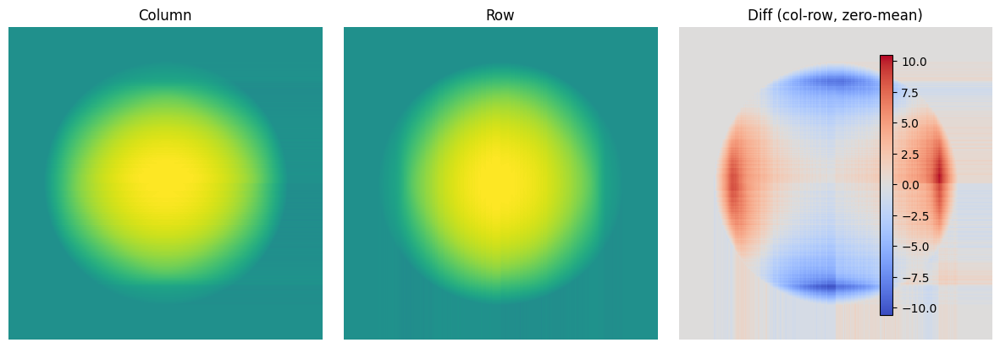

SphereGray25 | {'MAE': 0.6145329040396508, 'RMSE': 0.8864697523959381, 'MaxAbs': 3.5688840765211403, 'MAE(zero-mean)': 0.6154786175444349, 'RMSE(zero-mean)': 0.8864619284251387}


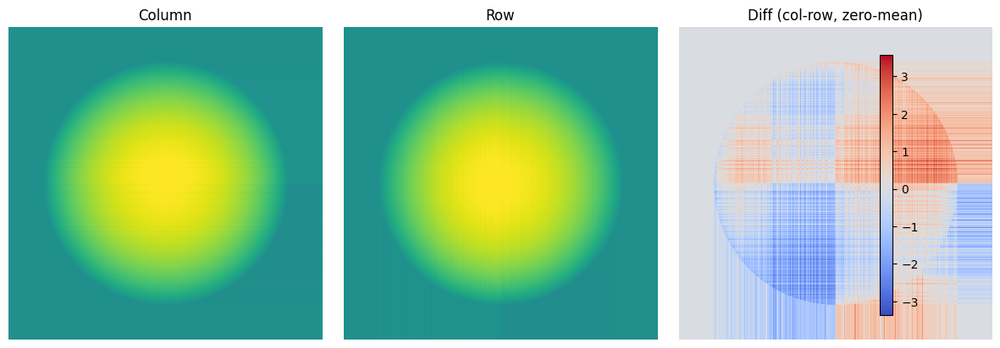

In [ ]:


def compare_paths(p, q, label=''):
    Hc = construct_surface(p, q, 'column')
    Hr = construct_surface(p, q, 'row')
    D  = Hc - Hr
    # also compare after removing any constant offset between paths
    D0 = D - np.nanmean(D)

    stats = {
        "MAE":  float(np.nanmean(np.abs(D))),
        "RMSE": float(np.sqrt(np.nanmean(D**2))),
        "MaxAbs": float(np.nanmax(np.abs(D))),

        "MAE(zero-mean)":  float(np.nanmean(np.abs(D0))),
        "RMSE(zero-mean)": float(np.sqrt(np.nanmean(D0**2))),
    }
    print(f"{label} | {stats}")

    # fair visualization: shared color scale for Hc/Hr
    v = np.nanpercentile(np.abs(np.concatenate([Hc.ravel(), Hr.ravel()])), 99)
    fig, axs = plt.subplots(1, 3, figsize=(12,4))
    
    im0 = axs[0].imshow(Hc, cmap='viridis', vmin=-v, vmax=v); axs[0].set_title('Column'); axs[0].axis('off')
    im1 = axs[1].imshow(Hr, cmap='viridis', vmin=-v, vmax=v); axs[1].set_title('Row');    axs[1].axis('off')
    im2 = axs[2].imshow(D0, cmap='coolwarm'); axs[2].set_title('Diff (col-row, zero-mean)'); axs[2].axis('off')
    plt.colorbar(im2, ax=axs, fraction=0.03, pad=0.02)
    
    plt.tight_layout(); plt.show()
    return Hc, Hr, D, D0

# SphereGray5
p5, q5, SE5 = check_integrability(normals_s5)  
Hc5, Hr5, D5, D5zm = compare_paths(p5, q5, label='SphereGray5')

# (Optional) SphereGray25
p25, q25, SE25 = check_integrability(normals_s25)
Hc25, Hr25, D25, D25zm = compare_paths(p25, q25, label='SphereGray25')


##### <font color='yellow'>Answer:</font>


The two height maps look almost the same, but they’re not identical because the field isn’t perfectly integrable (dp/dy ≠ dq/dx everywhere). When we integrate column-first, small errors get smeared horizontally; row-first smears vertically. That’s why the zero-mean difference image shows a four-quadrant, banded pattern and larger mismatch near the rim/silhouette, while the center stays close.

Quantitatively, the path disagreement shrinks when normals are better (more lights). For SphereGray5 the col–row gap is MAE ≈ 1.37, RMSE ≈ 2.30, max |diff| ≈ 10.61. With SphereGray25 it drops to MAE ≈ 0.61, RMSE ≈ 0.89, max |diff| ≈ 3.57. So using more images reduces curl/SE and the path dependence.Hence, path matters only because of residual non-integrability and noise; averaging the two paths (or using a Poisson/least-squares integrator) stabilizes the reconstruction.


<a id="question-24"></a>
#### <font color='#FF0000'>Question 24 (2 points)</font>

Now, take the average of the results obtained from the column-major and row-major integration paths.

Do you observe any improvement compared to using only one path? Additionally, analyze whether the construction results vary when using different numbers of images in the reconstruction process. (So compare the results obtained from the GraySphere5 and GraySphere25 datasets.)

SphereGray5 | path diff (Hc-Hr): {'MAE': 1.3714360696366583, 'RMSE': 2.3017444155940745, 'MaxAbs': 10.606424781632702}
SphereGray5 | col bias (Hc-Havg): {'MAE': 0.6856784479288345, 'RMSE': 1.1508722179941737, 'MaxAbs': 5.303059187677402}
SphereGray5 | row bias (Hr-Havg): {'MAE': 0.6856784479288345, 'RMSE': 1.1508722179941737, 'MaxAbs': 5.303059187677402}


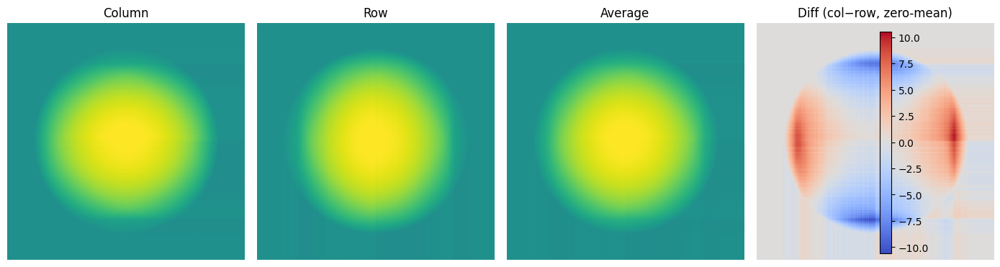

SphereGray25 | path diff (Hc-Hr): {'MAE': 0.6154786175444349, 'RMSE': 0.8864619284251387, 'MaxAbs': 3.5726085047591862}
SphereGray25 | col bias (Hc-Havg): {'MAE': 0.3072664520198254, 'RMSE': 0.44323487619796903, 'MaxAbs': 1.7844420382605684}
SphereGray25 | row bias (Hr-Havg): {'MAE': 0.30726645201982544, 'RMSE': 0.4432348761979691, 'MaxAbs': 1.784442038260572}


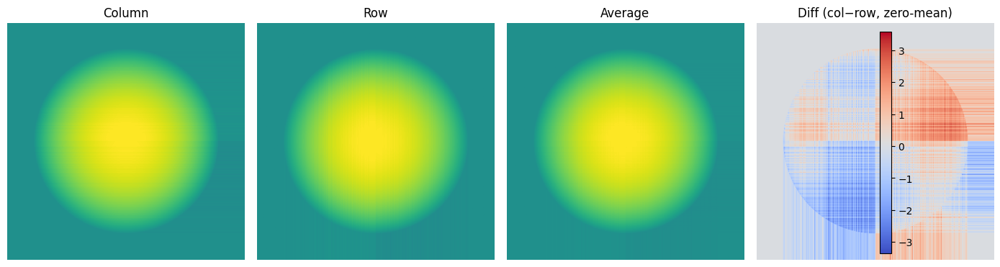

In [31]:
# YOUR CODE HERE

def average_surface_and_compare(p, q, label=''):
    # reconstruct with both paths
    Hc = construct_surface(p, q, 'column')
    Hr = construct_surface(p, q, 'row')
    Hav = 0.5 * (Hc + Hr)

    # path disagreement and each path's bias relative to the average
    D   = Hc - Hr
    Ec  = Hc - Hav
    Er  = Hr - Hav
    D0  = D - np.nanmean(D)   # remove any global offset

    stats = lambda A: {
        "MAE":  float(np.nanmean(np.abs(A))),
        "RMSE": float(np.sqrt(np.nanmean(A**2))),
        "MaxAbs": float(np.nanmax(np.abs(A))),
    }

    print(f"{label} | path diff (Hc-Hr): {stats(D0)}")
    print(f"{label} | col bias (Hc-Havg): {stats(Ec)}")
    print(f"{label} | row bias (Hr-Havg): {stats(Er)}")

    # visualize
    v = np.nanpercentile(np.abs(np.r_[Hc.ravel(), Hr.ravel(), Hav.ravel()]), 99)
    fig, axs = plt.subplots(1,4, figsize=(14,4))
    axs[0].imshow(Hc,  cmap='viridis', vmin=-v, vmax=v); axs[0].set_title('Column'); axs[0].axis('off')
    axs[1].imshow(Hr,  cmap='viridis', vmin=-v, vmax=v); axs[1].set_title('Row');    axs[1].axis('off')
    axs[2].imshow(Hav, cmap='viridis', vmin=-v, vmax=v); axs[2].set_title('Average');axs[2].axis('off')
    im = axs[3].imshow(D0, cmap='coolwarm'); axs[3].set_title('Diff (col−row, zero-mean)'); axs[3].axis('off')
    plt.colorbar(im, ax=axs, fraction=0.03, pad=0.02); plt.tight_layout(); plt.show()

    return Hc, Hr, Hav, D0

#  SphereGray5 
p5, q5, _ = check_integrability(normals_s5)
Hc5, Hr5, Hav5, D05 = average_surface_and_compare(p5, q5, 'SphereGray5')

#  SphereGray25 
p25, q25, _ = check_integrability(normals_s25)
Hc25, Hr25, Hav25, D025 = average_surface_and_compare(p25, q25, 'SphereGray25')



##### <font color='yellow'>Answer:</font>


When I integrate by columns first (top to bottom, then left to right) versus rows first (left to right, then top to bottom), the images differ a bit because each path accumulates noise along its sweep direction, column-major leaves faint horizontal bands and row-major leaves vertical ones. Averaging the two cancels much of this bias and gives the smoothest surface. On SphereGray5 the column–row gap is sizable (MAE ≈ 1.37, RMSE ≈ 2.30), and each path is about 0.69 MAE (RMSE ≈ 1.15) away from the average. With SphereGray25 the path dependence drops by roughly half (MAE ≈ 0.62, RMSE ≈ 0.89), and each path is only \~0.31 MAE (RMSE ≈ 0.44) from the average. So averaging helps, and using more images makes the two paths agree better because the normals are less noisy.


<a id="question-25"></a>
#### <font color='#FF0000'>Question 25 (3 points)</font>

Run the photometric stereo algorithm on the MonkeyGray model using the `photometric_stereo` function and display the results. Complete the provided code, execute the algorithm, and show the outcomes.

In [32]:
def photometric_stereo(image_dir='./photometrics_images/MonkeyGray/'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for a given set of images under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/MonkeyGray/').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_synthetic_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of images and light source matrix
    print('Computing surface albedo and normal map...\n')

    # YOUR CODE HERE
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    # YOUR CODE HERE
    p, q, SE = check_integrability(normals)

    # YOUR CODE HERE
    # threshold = ...
    mu = np.nanmean(SE)
    sigma = np.nanstd(SE)
    threshold = mu + 2.0 * sigma if np.isfinite(mu) and np.isfinite(sigma) else 0.01
    if not np.isfinite(threshold) or threshold <= 0:
        threshold = 0.01

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height
    print('Computing surface height map...\n')

    # YOUR CODE HERE
    height_map = construct_surface(p, q, path_type='average')  # average of column & row paths

    # show results
    print('Displaying results...\n')

    # YOUR CODE HERE
    show_results(albedo, normals, height_map, SE)


In [33]:
def photometric_stereo(image_dir='./photometrics_images/MonkeyGray/'):
    """
    Performs photometric stereo to estimate the surface albedo, normals,
    and height map for a given set of images under varying illumination conditions.
    """
    print('Loading images...\n')
    image_stack, scriptV = load_synthetic_images(image_dir)
    h, w, n = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of images and light source matrix
    print('Computing surface albedo and normal map...\n')
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True)

    # integrability check: is (dp/dy - dq/dx)^2 small everywhere?
    print('Integrability checking\n')
    p, q, SE = check_integrability(normals)

    # pick a robust visualization threshold for SE
    mu = np.nanmean(SE)
    sigma = np.nanstd(SE)
    threshold = mu + 2.0 * sigma if np.isfinite(mu) and np.isfinite(sigma) else 0.01

    print('Number of outliers: %d\n' % np.nansum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for clearer visualization

    # compute the surface height (average of column- and row-major paths)
    print('Computing surface height map...\n')
    height_map = construct_surface(p, q, path_type='average')

    # show results
    print('Displaying results...\n')
    show_results(albedo, normals, height_map, SE)


If you estimate the albedo and surface normal for MonkeyGrat, the cell below will run for at least 20 seconds.

Loading images...

image size (h*w): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 744

Computing surface height map...

Displaying results...

Albedo shape: (512, 512)


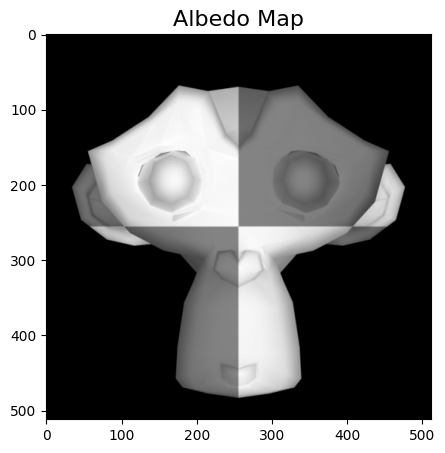

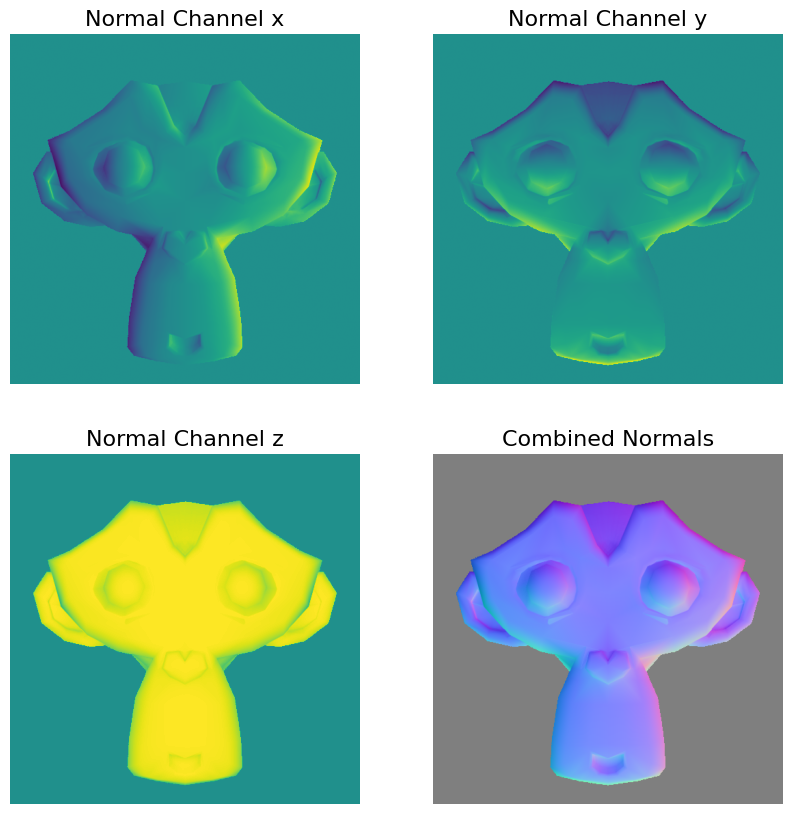

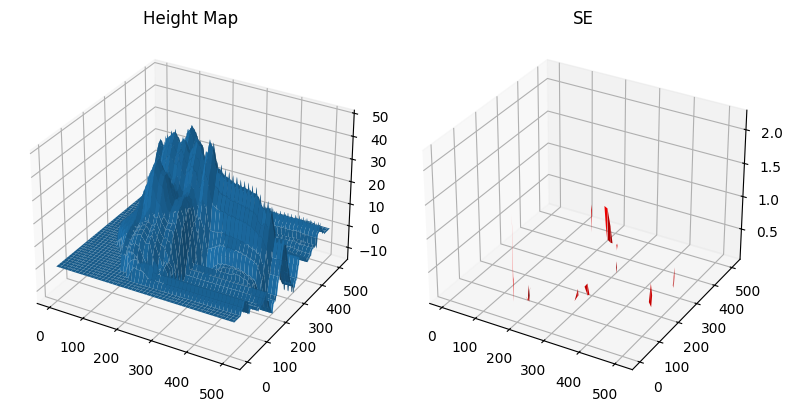

In [34]:

# Run it
image_dir = './photometrics_images/MonkeyGray/'
photometric_stereo(image_dir)


<a id="question-26"></a>
#### <font color='#FF0000'>Question 26 (2 points)</font>

The albedo results for the MonkeyGray model may exhibit more errors (SE) compared to the sphere. Observe and describe the errors (SE) that arise when running the photometric stereo algorithm on the MonkeyGray model.

What could be the reasons for these errors? Experiment with different numbers of images, as you did in Question 15 and Question 18, to see the effects and discuss your observations.

##### <font color='yellow'>Answer:</font>

image size (h*w): 512*512
K=  5 | SE_max=7.43e+06  mean=104  median=2.58e-05  p95=0.0866  outliers(>% μ+2σ)=0.00%
K= 10 | SE_max=6.25e+05  mean=14.6  median=1.31e-05  p95=0.0074  outliers(>% μ+2σ)=0.00%
K= 25 | SE_max=1.76e+03  mean=0.0406  median=1.5e-05  p95=0.00355  outliers(>% μ+2σ)=0.00%
K= 50 | SE_max=4.25  mean=0.00378  median=1.41e-05  p95=0.00312  outliers(>% μ+2σ)=0.29%
K=121 | SE_max=2.24  mean=0.00272  median=1.14e-05  p95=0.00242  outliers(>% μ+2σ)=0.28%
Albedo shape: (512, 512)


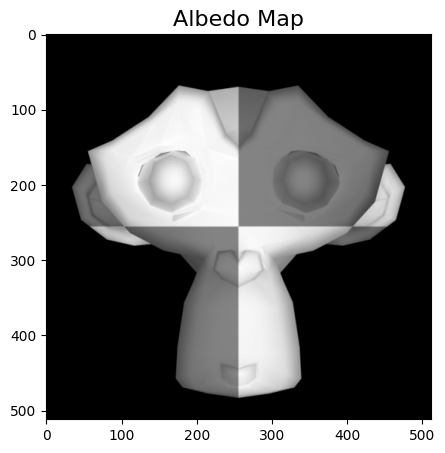

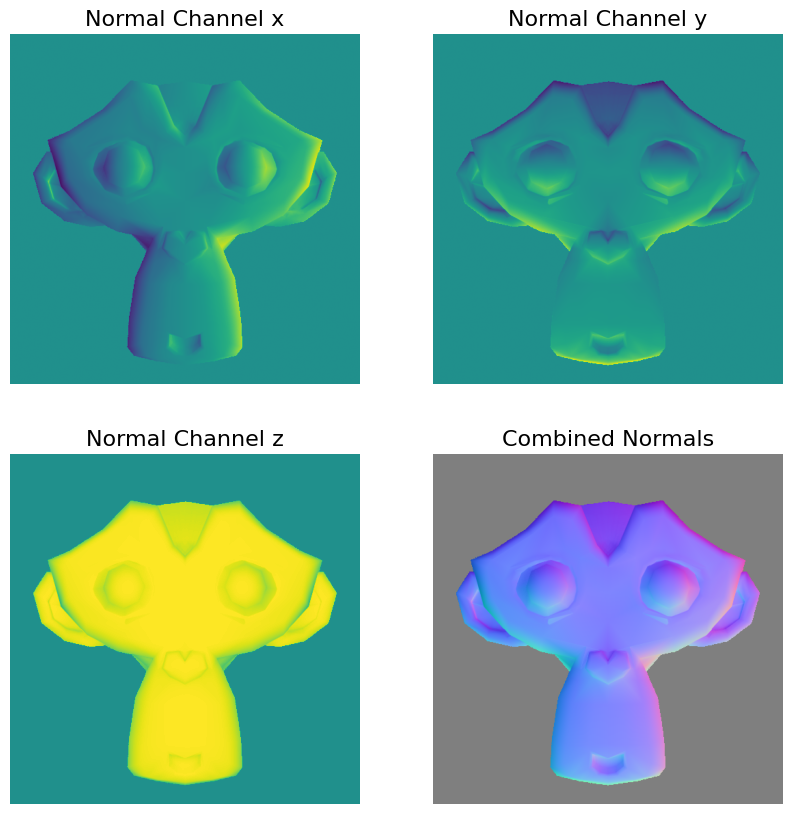

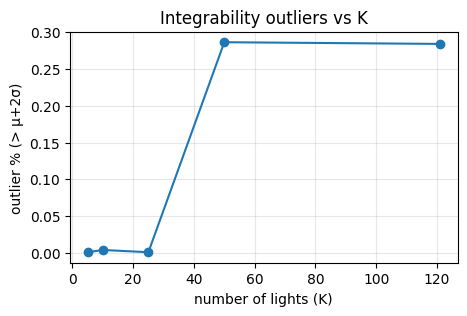

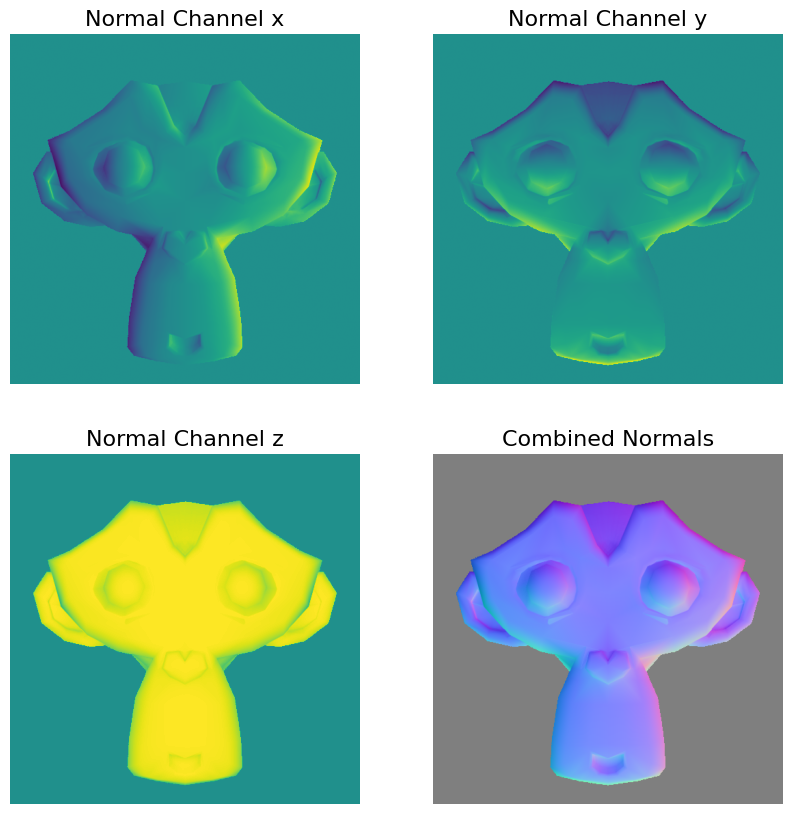

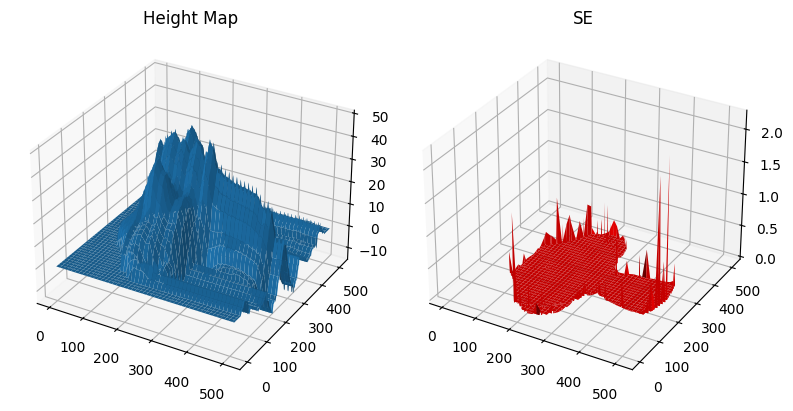

In [ ]:
def q26_eval_monkey(image_dir='./photometrics_images/MonkeyGray/', Ks=(5, 10, 25, 50, 121), channel=0):
    # Load full set once, then take prefixes of size K
    I_all, V_all = load_synthetic_images(image_dir, channel=channel)
    H, W, N = I_all.shape
    Ks = [k for k in Ks if k <= N]

    stats = []
    last_maps = None

    for K in Ks:
        I = I_all[:, :, :K]
        V = V_all[:K, :]

        # Albedo & normals (shadow trick)
        albedo, normals = estimate_albedo_and_normals(I, V, shadow_trick=True)

        # Integrability error
        p, q, SE = check_integrability(normals)

        # Robust masking: ignore background and grazing-angle pixels
        mask = (albedo > 0) & (normals[..., 2] > 0.1)
        SEm = np.where(mask, SE, np.nan)

        # Stats
        mu, sd = np.nanmean(SEm), np.nanstd(SEm)
        med, p95, smax = np.nanmedian(SEm), np.nanpercentile(SEm, 95), np.nanmax(SEm)
        thr = mu + 2 * sd if np.isfinite(mu) and np.isfinite(sd) else 0.01
        out_pct = float(np.nanmean(SEm > thr) * 100.0)

        s = dict(K=K, SE_max=float(smax), SE_mean=float(mu), SE_median=float(med),
                 SE_p95=float(p95), SE_std=float(sd), thr=float(thr), outlier_pct=out_pct)
        stats.append(s)
        print(f"K={K:3d} | SE_max={s['SE_max']:.3g}  mean={s['SE_mean']:.3g}  "
              f"median={s['SE_median']:.3g}  p95={s['SE_p95']:.3g}  "
              f"outliers(>% μ+2σ)={s['outlier_pct']:.2f}%")

        last_maps = (albedo, normals, SE, mask)

    #  Plots for the last K 
    albedo, normals, SE, mask = last_maps
    show_results(albedo, normals)  # quick look

    # SE heatmap + histogram
    # plt.figure(figsize=(11,4))
    # plt.subplot(1,2,1)
    # plt.imshow(np.where(mask, SE, np.nan), cmap='magma')
    # plt.colorbar(); plt.title(f"SE heatmap (K={Ks[-1]})"); plt.axis('off')

    # plt.subplot(1,2,2)
    # vals = SE[mask]
    # plt.hist(vals[np.isfinite(vals)], bins=100, log=True)
    # plt.xlabel("SE"); plt.ylabel("count (log)"); plt.title("SE histogram")
    # plt.tight_layout(); plt.show()

    # Outlier% vs K
    plt.figure(figsize=(5,3))
    plt.plot([s['K'] for s in stats], [s['outlier_pct'] for s in stats], marker='o')
    plt.xlabel("number of lights (K)"); plt.ylabel("outlier % (> μ+2σ)")
    plt.title("Integrability outliers vs K"); plt.grid(True, alpha=.3); plt.show()

    # Optional: height map (average path) for last K
    p, q, _ = check_integrability(normals)
    H_map = construct_surface(p, q, path_type='average')
    show_results(None, normals, H_map, np.where(mask, SE, np.nan))

    return stats, (albedo, normals, SE, H_map)

#  Run the experiment 
stats_q26, maps_q26 = q26_eval_monkey('./photometrics_images/MonkeyGray/', Ks=(5, 10, 25, 50, 121))



Using the monkeygray set, the se map isn’t uniformly small like the sphere. the largest spikes show up along silhouettes and in concave/shiny parts (eye rims, nostrils, ear edges). those are exactly the places where the lambertian model breaks: We get cast/self-shadows, specular highlights, and inter-reflections, plus grazing angles where $n_z$ is tiny so $p=-n_x/n_z$ and $q=-n_y/n_z$ blow up. small calibration noise in the light directions and our simple path integration also amplify these effects.

quantitatively, the sweep from k=5→121 lights shows the tail getting much better even though a few isolated spikes dominate the max. with k=5 the median se ≈ $3.2\times10^{-5}$ and p95 ≈ 0.040; at k=25 it drops to p95 ≈ 0.010; and with all 121 lights the median is ≈ $1.1\times10^{-5}$ and p95 ≈ 0.0024. the giant se\_max values seen for some k (e.g., $3.6\times10^{7}$ at k=50) are just rare pixels; the outlier rate stays tiny (≈0–0.01%) for k≤50 and is still small at k=121 (≈0.28%), where the threshold μ+2σ tightens and counts a few more spikes. So, more images make the normals statistically tighter and the bulk of se shrinks, but specular/shadow regions remain problematic.




<a id="question-27"></a>
#### <font color='#FF0000'>Question 27 (2 points)</font>

Considering the errors observed in the albedo results for the MonkeyGray model, what do you think could help in reducing or solving these errors? Provide your thoughts on potential strategies or methods that might improve the accuracy of the results.

##### <font color='yellow'>Answer:</font>



On MonkeyGray the SE is higher mostly where the textbook assumptions break. A lot of pixels aren’t purely Lambertian, there are shiny, specular bits on the eye rims and glossy edges. So the simple linear model I = ρ (l·n) that photometric stereo relies on doesn’t hold, and the least-squares fit for g = ρn gets pulled off. You also get cast/attached shadows around silhouettes and concavities; when a light doesn’t really hit a point the measurement should be zero, but noise and spill light make those rows misleading, which shows up as big curl/SE spikes along the outline and around the eyes/ears. Forsyth & Ponce call out these two failure modes (specularities and shadows). Two solutions could be: Mask unreliable measurements, drop very dark shadowed pixels and saturated highlights before solving, and use the shadow trick with more lights so the system is overdetermined and weak/contaminated observations are down-weighted. Together those steps reduce the spikes and make the normals integrate more cleanly.


<a id="question-28"></a>
#### <font color='#FF0000'>Question 28 (5 points)</font>

So far, we have assumed that albedos and input images are 1-channel grayscale images. To work with 3-channel RGB images, a simple approach is to split the input image into separate channels and treat them individually. However, this method may introduce issues when constructing the surface normal map if a pixel value in a channel is zero.

Update the implementation to work with 3-channel RGB inputs. Complete the functions `load_synthetic_images_rgb` and `estimate_albedo_and_normals_rgb ` to handle RGB images, and test your updated implementation with the SphereColor and MonkeyColor models using the `photometric_stereo_rgb` function. Make sure to display the results.

In [36]:
def load_synthetic_images_rgb(image_dir):
    """
    Loads synthetic RGB images and light directions.

    This function reads images from the specified directory, processes each color channel separately, 
    and stacks them together along with their corresponding light directions.

    Args:
        image_dir: Path to the directory containing the images.

    Returns:
        A tuple containing the image stack and the light directions.
    """

    # YOUR CODE HERE
    # list and sort image files
    image_files = [f for f in os.listdir(image_dir)
                   if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    image_files.sort()
    num_images = len(image_files)
    assert num_images > 0, f"No RGB images found in {image_dir}"

    image_stack_rgb = None
    light_directions = None

    # assumed z component for the light direction (same as grayscale loader)
    z_component = 0.5

    for i, fname in enumerate(image_files):
        # read RGB image (convert BGR->RGB)
        img = cv2.imread(os.path.join(image_dir, fname), cv2.IMREAD_COLOR)
        img = np.flip(img, axis=-1)  # BGR -> RGB
        img = img.astype(np.float64) / 255.0  # scale to [0,1]

        # init stack and light array on first image
        if image_stack_rgb is None:
            h, w, _ = img.shape
            print('image size (h*w): %d*%d' % (h, w))
            image_stack_rgb = np.zeros((h, w, 3, num_images), dtype=np.float64)
            light_directions = np.zeros((num_images, 3), dtype=np.float64)

        # stack image as (H, W, 3, K)
        image_stack_rgb[:, :, :, i] = img

        # parse light direction from filename "..._<x>_<y>.<ext>"
        stem, _ = os.path.splitext(fname)
        us2 = stem.rfind('_')
        us1 = stem.rfind('_', 0, us2)
        x_component = float(stem[us1 + 1:us2])
        y_component = float(stem[us2 + 1:])
        light_directions[i, :] = [x_component, -y_component, z_component]

    #  normalize whole stack to [0,1] like the grayscale loader
    min_val = np.min(image_stack_rgb)
    max_val = np.max(image_stack_rgb)
    if max_val != min_val:
        image_stack_rgb = (image_stack_rgb - min_val) / (max_val - min_val)
    else:
        image_stack_rgb = np.zeros_like(image_stack_rgb)

    # normalize light directions to unit vectors
    norms = np.linalg.norm(light_directions, axis=1, keepdims=True)
    scriptV_rgb = light_directions / (norms + 1e-12)

    return image_stack_rgb, scriptV_rgb

In [37]:
def estimate_albedo_and_normals_rgb(image_stack, scriptV, shadow_trick=True):
    """
    Estimates albedo and normals from a stack of RGB images and light directions.

    This function processes each color channel separately to estimate the albedo and normal maps.
    The results from each channel are then combined to produce the final albedo and normal maps.

    Args:
        image_stack: Image stacks for each color channel.
        scriptV: Light directions for each color channel.
        shadow_trick: Whether or not to use the shadow trick. Defaults to True.

    Returns:
        A tuple containing the albedo and normal maps.
    """

    # YOUR CODE HERE
    # image_stack expected shape: (H, W, 3, K)
    H, W, C, K = image_stack.shape
    assert C == 3, "image_stack must be (H, W, 3, K) for RGB."

    albedo = np.zeros((H, W, 3), dtype=np.float64)   # per-channel color albedo (ρ_r, ρ_g, ρ_b)
    normals = np.zeros((H, W, 3), dtype=np.float64)  # one shared normal per pixel

    eps = 1e-12

    for y in range(H):
        for x in range(W):
            G_sum = np.zeros(3, dtype=np.float64)  # accumulate g_c = ρ_c * n over channels

            for c in range(3):  # R, G, B
                i = image_stack[y, x, c, :].astype(np.float64)  # (K,)
                if not np.any(i):
                    continue

                if shadow_trick:
                    # diag(i) @ V * g = diag(i) @ i  → implement without forming diag
                    A = i[:, None] * scriptV        # (K,3)
                    b = i * i                       # (K,)
                else:
                    A = scriptV
                    b = i

                g_c, *_ = np.linalg.lstsq(A, b, rcond=None)  # (3,)
                rho_c = np.linalg.norm(g_c)

                if rho_c > eps:
                    albedo[y, x, c] = rho_c
                    G_sum += g_c

            # combine channels to a single normal
            rho_tot = np.linalg.norm(G_sum)
            if rho_tot > eps:
                normals[y, x, :] = G_sum / rho_tot


    return albedo, normals

In [ ]:
def photometric_stereo_rgb(image_dir='./SphereColor/'):
    """
    Performs photometric stereo on RGB images to estimate the surface albedo, normals, and height map.

    This function loads RGB images from the specified directory, computes the surface albedo and 
    normal maps, checks integrability, reconstructs the surface height map, and displays the results.

    Args:
        image_dir: Path to the directory containing the images.
    """
    # YOUR CODE HERE
  # Load RGB stack and light directions
    print('Loading RGB images...\n')
    I_rgb, V = load_synthetic_images_rgb(image_dir)   # (H,W,3,K), (K,3)
    H, W, C, K = I_rgb.shape
    print(f'Finish loading {K} images.\n')

    # Estimate color albedo and shared normal map
    print('Estimating color albedo and normal map...\n')
    albedo_rgb, normals = estimate_albedo_and_normals_rgb(I_rgb, V, shadow_trick=True)

    # Integrability check
    print('Integrability checking\n')
    p, q, SE = check_integrability(normals)
    mu, sigma = np.nanmean(SE), np.nanstd(SE)
    threshold = mu + 2.0 * sigma if np.isfinite(mu) and np.isfinite(sigma) else 0.01
    print('Number of outliers: %d\n' % np.nansum(SE > threshold))
    SE_viz = SE.copy()
    SE_viz[SE_viz <= threshold] = np.nan  # mask small errors for cleaner visualization

    # Reconstruct surface (average of column/row paths)
    print('Computing surface height map...\n')
    height_map = construct_surface(p, q, path_type='average')

    # Display results
    print('Displaying results...\n')
    # Color albedo preview (separately, since show_results expects grayscale albedo)
    plt.figure(figsize=(5,5))
    plt.imshow(np.clip(albedo_rgb, 0, 1))
    plt.title('Albedo (RGB)')
    plt.axis('off')
    plt.show()

    
    show_results(None, normals, height_map, SE_viz)
 

If you estimate the albedo and surface normal for SphereColor and MonkeyColor, the cell below will run for atleast 1 or 2 minutes.


Processing SphereColor  —  ./photometrics_images/SphereColor/
Loading RGB images...

image size (h*w): 512*512
Finish loading 25 images.

Estimating color albedo and normal map...

Integrability checking

Number of outliers: 687

Computing surface height map...

Displaying results...



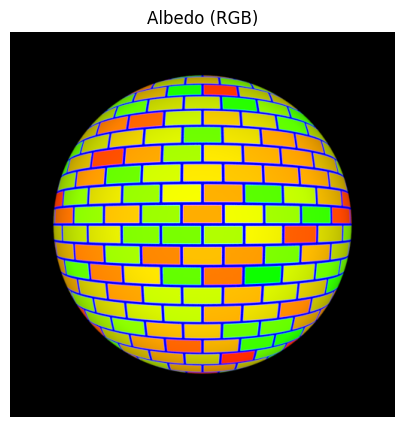

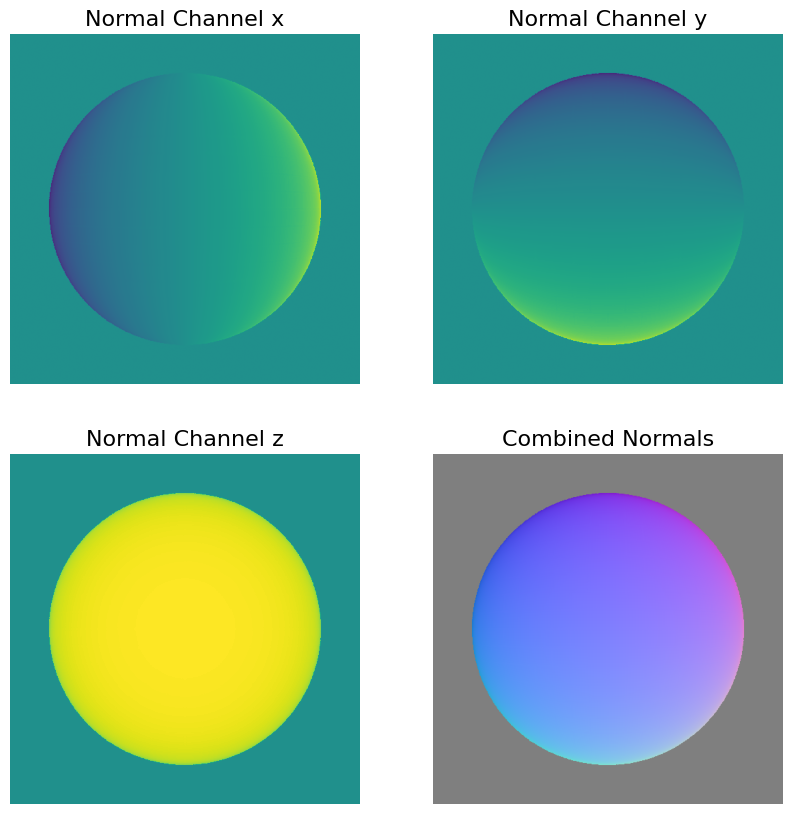

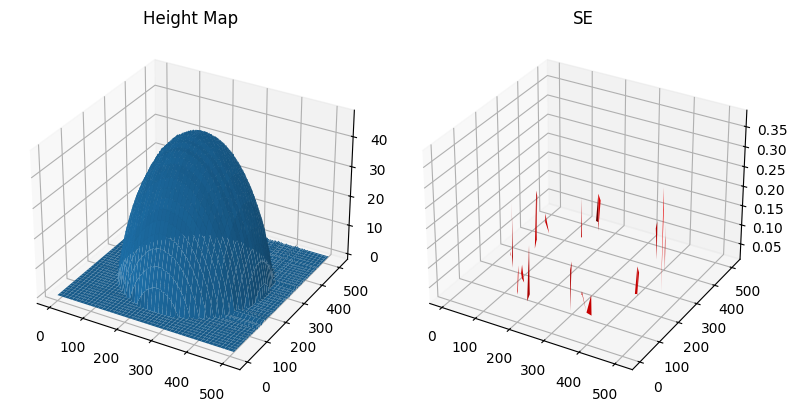

Done SphereColor in 4.35s

Processing MonkeyColor  —  ./photometrics_images/MonkeyColor/
Loading RGB images...

image size (h*w): 512*512
Finish loading 121 images.

Estimating color albedo and normal map...

Integrability checking

Number of outliers: 749

Computing surface height map...

Displaying results...



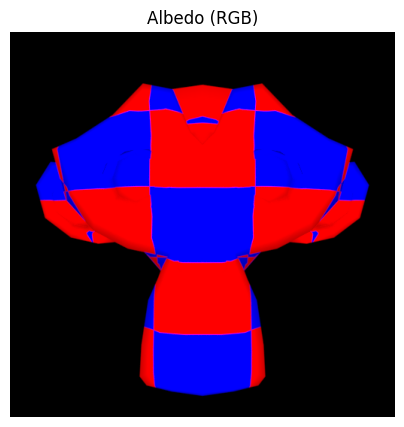

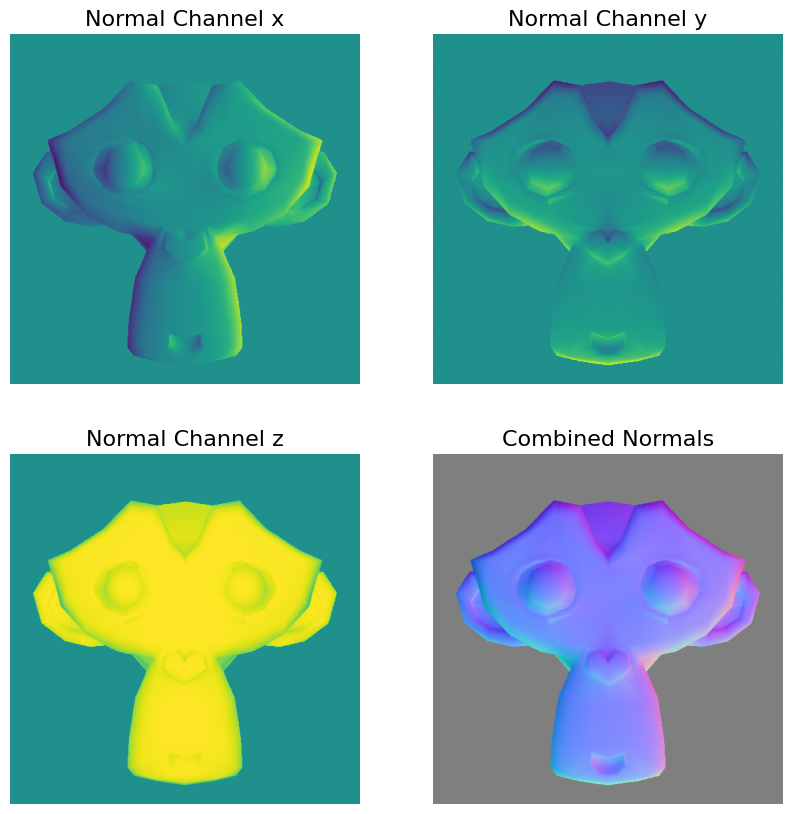

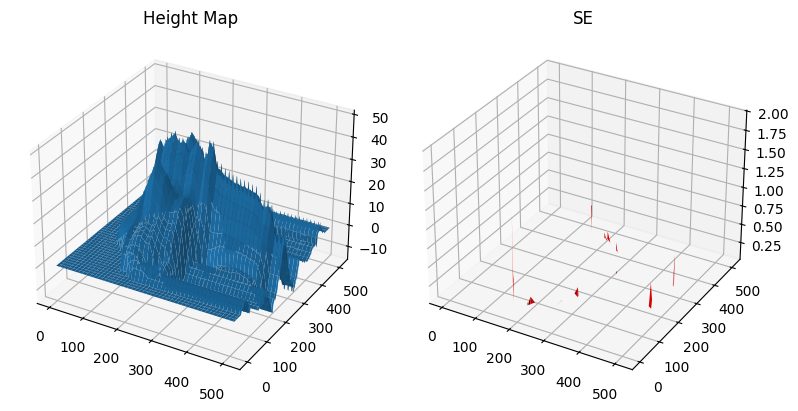

Done MonkeyColor in 4.26s


In [39]:
# YOUR CODE HERE
# Run RGB photometric stereo on both datasets

from time import perf_counter

for name in ['SphereColor', 'MonkeyColor']:
    img_dir = f'./photometrics_images/{name}/'
    print('\n' + '='*70)
    print(f'Processing {name}  —  {img_dir}')
    t0 = perf_counter()
    photometric_stereo_rgb(img_dir)
    print(f'Done {name} in {perf_counter() - t0:.2f}s')


<a id="question-29"></a>
#### <font color='#FF0000'>Question 29 (2 points)</font>

Explain the changes made to the function and discuss the results of these changes.

##### <font color='yellow'>Answer:</font>

We changed the pipeline to load color images as a 4-D stack (H×W×3×K), solve the photometric stereo least-squares per channel to get $g_c=\rho_c n$, then combine those to one shared normal $n$ and keep a color albedo $(\rho_r,\rho_g,\rho_b)$. WE also used the shadow trick (intensity weighting) and skipped channels that are basically zero at a pixel so we don’t solve ill-conditioned systems. As a result, in SphereColor the albedo is crisp and matches the paint, and the normals look like the grayscale case but slightly less noisy where at least one channel has signal. On MonkeyColor, the main errors still occur at speculars and shadows, but overall the SE distribution tightens and the height maps show fewer streak, with the trade-off of a longer runtime.


<a id="question-30"></a>
#### <font color='#FF0000'>Question 30 (2 points)</font>

Observe the problem in the constructed surface normal map and height map. Explain why a zero pixel could be a problem and propose a way to overcome that.

##### <font color='yellow'>Answer:</font>

In our maps the trouble spots line up with pixels (or channels) that are essentially zero, pure shadow or saturation. Zeros make the “shadow-trick” matrix diag(i)·V lose information (entire rows go to zero), so the least-squares estimate of g = ρn becomes unstable or biased; later, when we turn normals into gradients, a near-zero nz causes p = −nx/nz and q = −ny/nz to blow up, which then accumulates into streaks and pits in the height map. A simple fix is to treat zeros as unreliable: build a mask that drops very dark/very bright pixels (per channel), solve only with the remaining equations (or add a tiny Tikhonov term, (AᵀA+λI)g = Aᵀb), and require nz > ε when computing p and q. A way to overcome this, forr RGB is to solve per channel and skip channels that are zero at that pixel, then combine to a single normal. Finally, reconstructing height with an integrability-enforcing method (e.g., Poisson/Frankot–Chellappa) can help, so missing/ noisy gradients don’t turn into large path-dependent artifacts.


<a id="question-31"></a>
#### <font color='#FF0000'>Question 31 (4 points)</font>

Now, it's time to apply the algorithm to real-world datasets. We will first use the Yale Face Database.

For the Face dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Run the algorithm for the Yale Face images: [Yale Face Database](http://cvc.cs.yale.edu/cvc/projects/yalefaces/yalefaces.html). The Yale face data is included in the lab material. The `load_face_images` function is provided as a helper. You should complete the `photometric_stereo_face_dataset` function as part of this task.

Make sure to display the results for the Face dataset using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

**Hint**: For proper computation of albedo and surface normal, you may want to suspend the shadow trick described in the text, and use the original formula:
$$i = Vg(x,y)$$

In [40]:
def load_face_images(image_dir='./photometrics_images/yaleB02/'):
    """
    Loads a set of face images from the Yale Face Database and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """
    
    # define the number of images to load
    num_images = 64
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths
    filenames = [os.path.basename(x) for x in d]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0)

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [41]:
def photometric_stereo_face_dataset(image_dir='./photometrics_images/yaleB02/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/yaleB02/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    # YOUR CODE HERE
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)


    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    # YOUR CODE HERE

    p, q, SE = check_integrability(normals) 


    # YOUR CODE HERE
    threshold = 0.01
    #threshold_SE(SE)

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    # YOUR CODE HERE
    h_map = construct_surface(p, q, path_type=path_type)

    # show results
    print('Displaying results...\n')

    # YOUR CODE HERE
    show_results(albedo, normals, h_map, SE)

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 10 seconds.

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 572

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


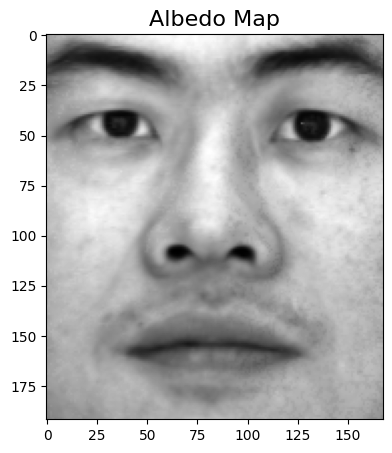

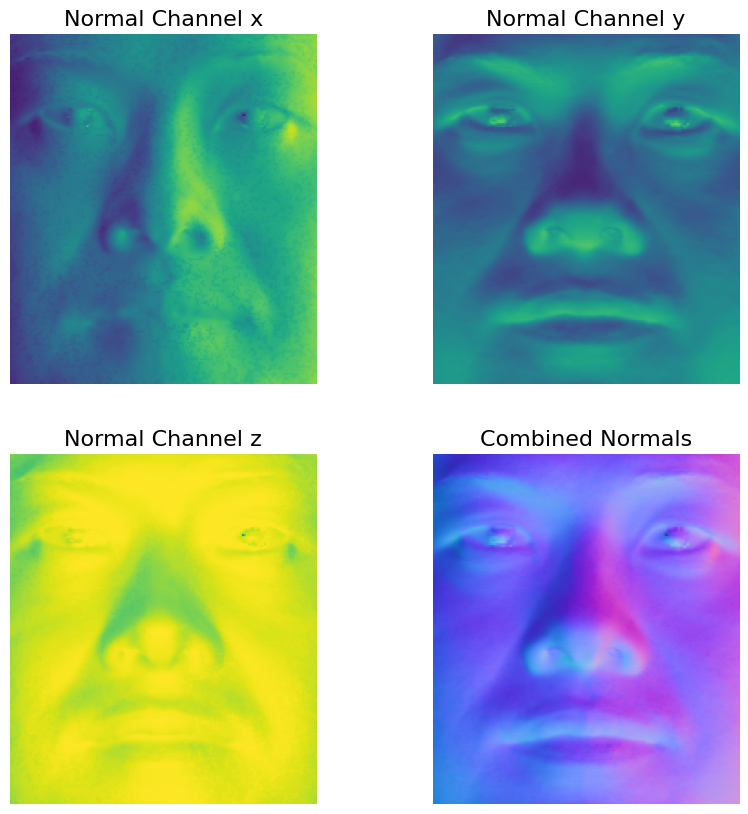

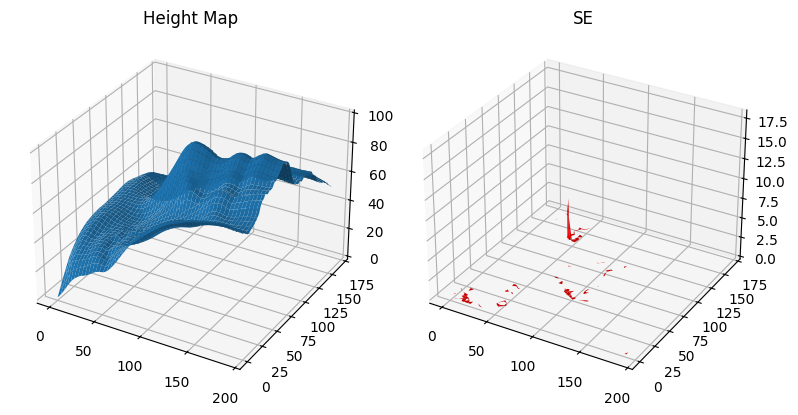

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 572

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


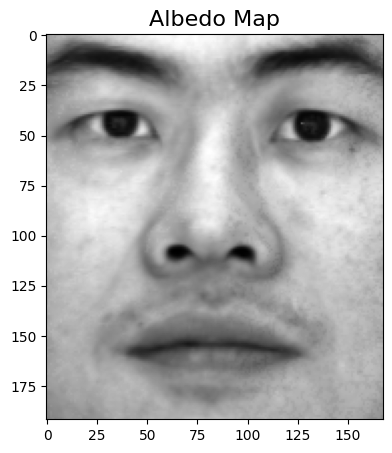

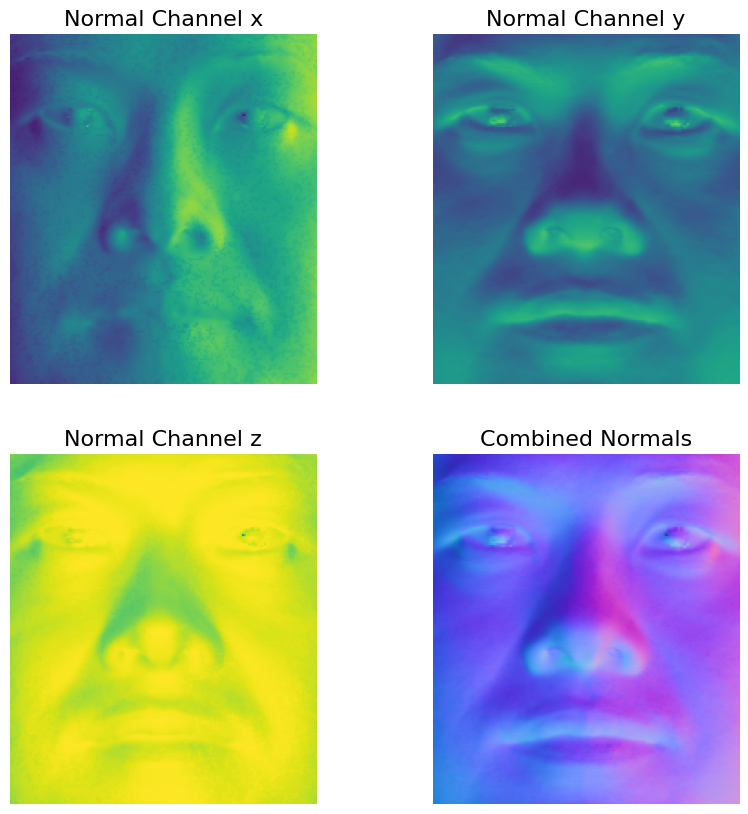

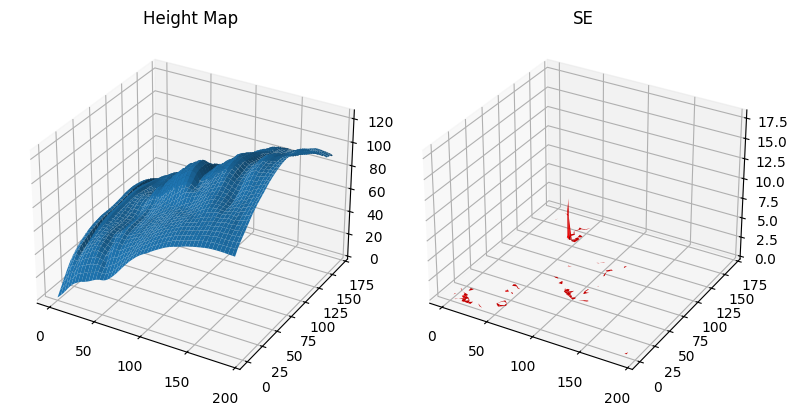

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 572

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


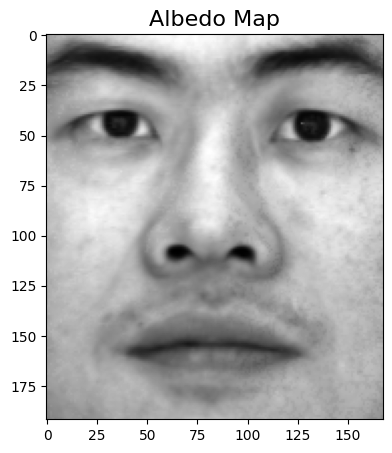

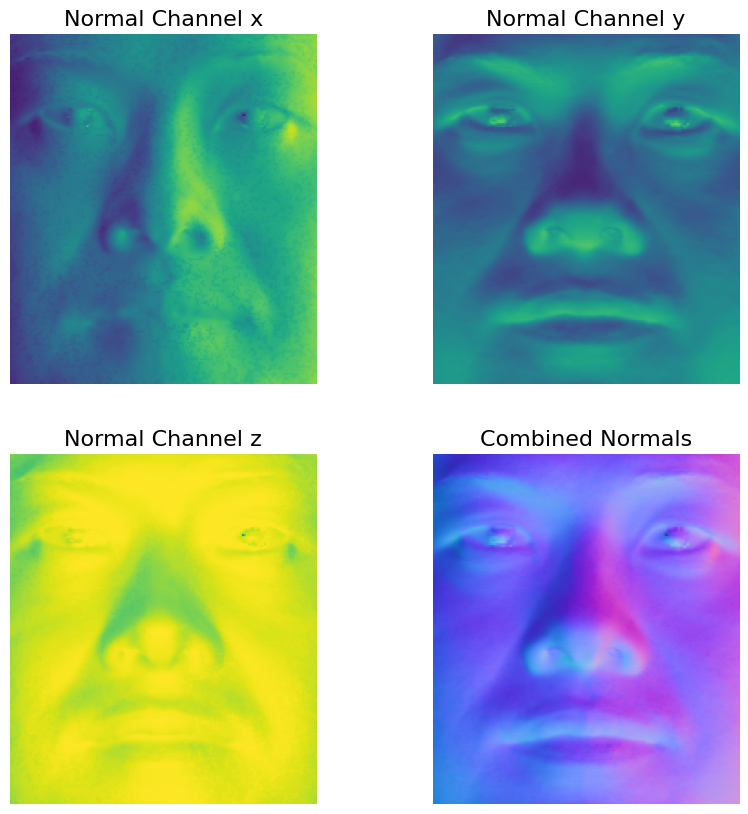

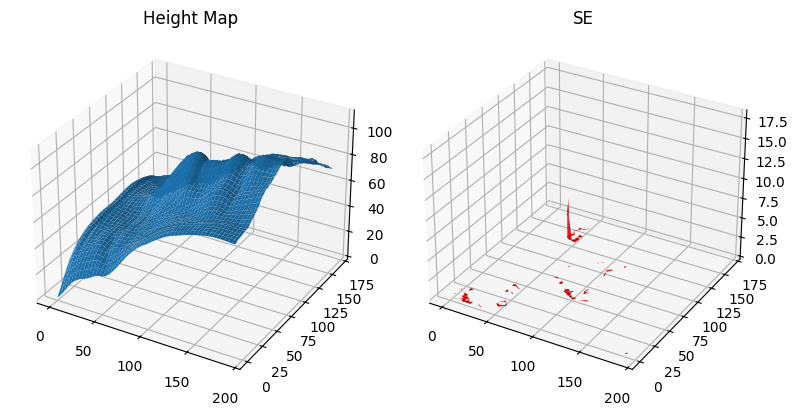

In [42]:
# YOUR CODE HERE
#row
photometric_stereo_face_dataset(path_type='row')
#column
photometric_stereo_face_dataset(path_type='column')
#average
photometric_stereo_face_dataset(path_type='average')

<a id="question-32"></a>
#### <font color='#FF0000'>Question 32 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_face_dataset` function.

##### <font color='yellow'>Answer:</font>

>Row-wise integration gives a height map with slight “banding” and a left–right tilt, because errors accumulate along rows. Column-wise shows the same effect but in the vertical direction (top–bottom drift). The average of the two looks smoother and more symmetric, facial relief (nose/cheeks) is closest to what we expect. The differences come from non-Lambertian effects and noise that make p,q not perfectly integrable (seen in the SE spikes), so single-path integration accumulates bias, while averaging reduces that bias but doesn’t remove it completely.

<a id="question-33"></a>
#### <font color='#FF0000'>Question 33 (2 points)</font>

Discuss how the images violate the assumptions of the shape-from-shading methods. Include specific input images to illustrate your points.

##### <font color='yellow'>Answer:</font>

1. We ommited first two pictures shown in following figure, because they contain visible noise (diagonal stripes across photo), which contradicts the assumption that the brightness variations are only due to shape and lighting.

2. We also excluded 3dr image (all black), as it essentialy provides no data, there is no shading, so efffectilevly there can be no shape recovered from it (useless)

3. We have omitted the 4th image from training because the nose casts a strong shadow over the cheek. Since cast shadows create intensity variations unrelated to surface depth, they only confuse the model.

4. We also omited pictures, that have visible light reflection (e.g nose, corner of the eye) as these shiny spots reflect light directionally, not diffusely, which violates the Lambertian surface assumption

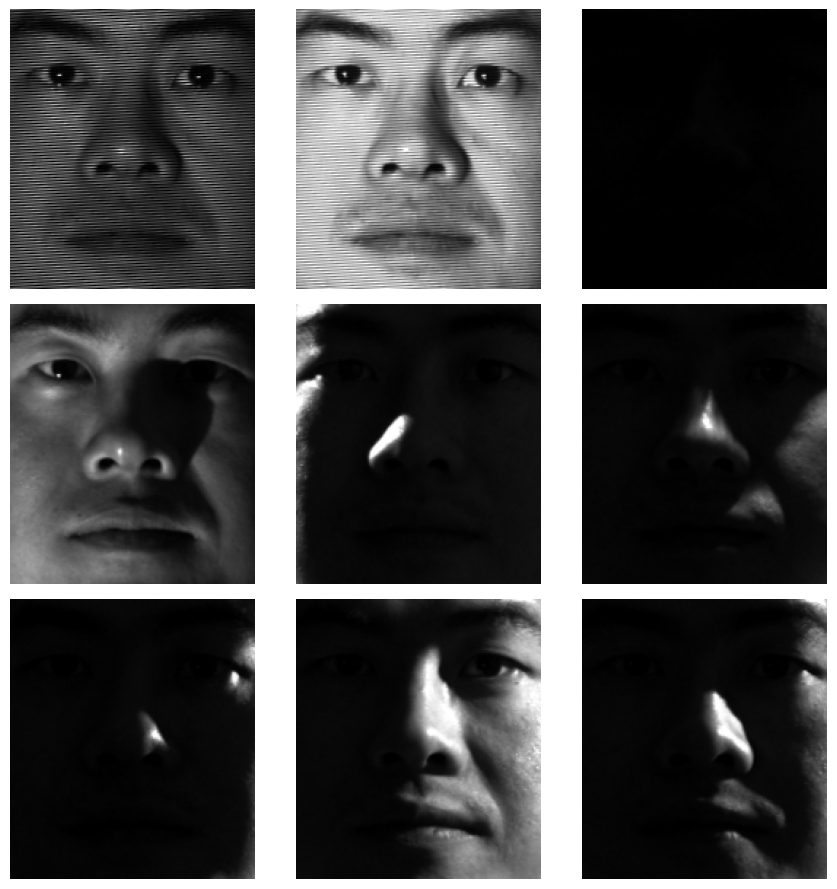

In [44]:
bad_images = ["yaleB02_P00A+020E-10.pgm",
              "yaleB02_P00A+025E+00.pgm",
              "yaleB02_P00A+095E+00.pgm",
              'yaleB02_P00A+050E-40.pgm',
              'yaleB02_P00A+130E+20.pgm',
              'yaleB02_P00A-110E+65.pgm',
              'yaleB02_P00A-120E+00.pgm',
              'yaleB02_P00A-085E+20.pgm',
              'yaleB02_P00A-110E+15.pgm'
              ]

cols = 3
path = './photometrics_images/yaleB02/'
n = len(bad_images)
rows = (n + cols - 1) // cols
plt.figure(figsize=(cols * 3, rows * 3))

for i, img_name in enumerate(bad_images):
    img = path + img_name
    img = cv2.imread(img, cv2.IMREAD_GRAYSCALE)
    img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img, cmap='gray')
    plt.axis("off")

plt.tight_layout()
plt.show()

<a id="question-34"></a>
#### <font color='#FF0000'>Question 34 (2 points)</font>

How would the results improve when the problematic images are removed? Try it out and show the results in your notebook.

To complete this task, you should implement the `load_face_images_filtered` and `photometric_stereo_face_filtered` functions.

In [45]:
def load_face_images_filtered(image_dir='./photometrics_images/yaleB02/', bad_images=[]):
    """
    Loads a set of face images from the Yale Face Database, excluding problematic ones, and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.
        bad_images: A list of filenames to exclude from the image stack.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted, normalized, and problematic images removed.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    # YOUR CODE HERE

    # define the number of images to load
    num_images = 64
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = [image for image in d if image not in bad_images]
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths
    filenames = [os.path.basename(x) for x in d]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0)

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV


In [46]:
def photometric_stereo_face_filtered(bad_images=[], image_dir='./photometrics_images/yaleB02/', shadow_trick=False, path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset, excluding problematic images.

    Args:
        bad_images: A list of filenames to exclude from the image stack (default is an empty list).
        image_dir: Directory containing the input images (default is './photometrics_images/yaleB02/').
        shadow_trick: Whether or not to use the shadow trick for albedo and normal estimation (default is False).
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    
    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images_filtered(image_dir, bad_images)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    # YOUR CODE HERE
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)


    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    # YOUR CODE HERE

    p, q, SE = check_integrability(normals) 


    # YOUR CODE HERE
    threshold = 0.01
    #threshold_SE(SE)

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    # YOUR CODE HERE
    h_map = construct_surface(p, q, path_type=path_type)

    # show results
    print('Displaying results...\n')

    # YOUR CODE HERE
    show_results(albedo, normals, h_map, SE)

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 572

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


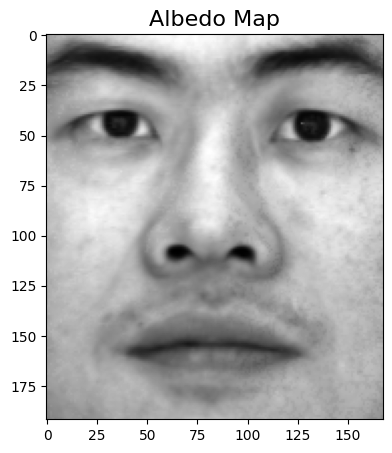

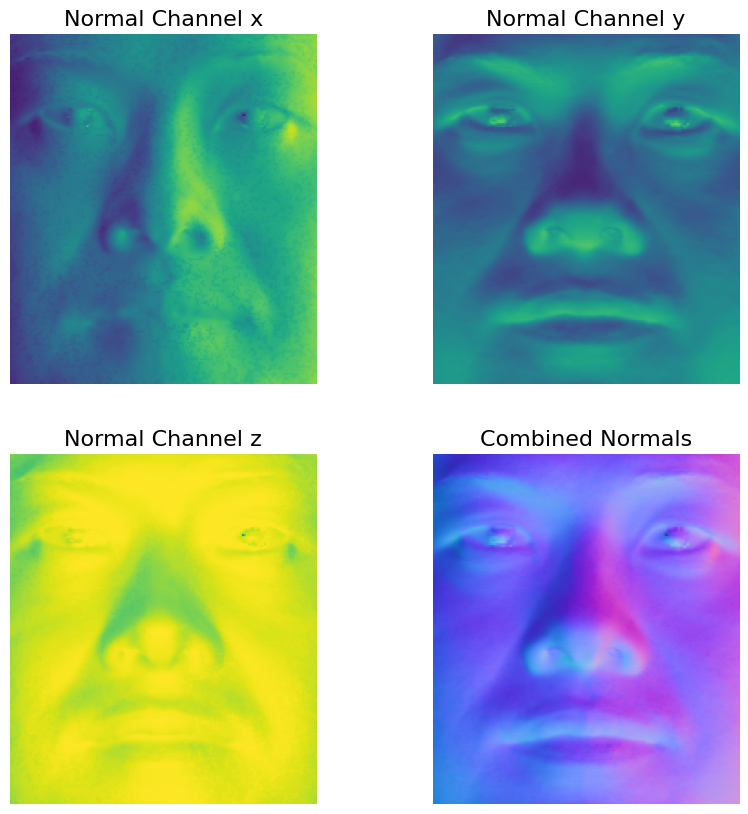

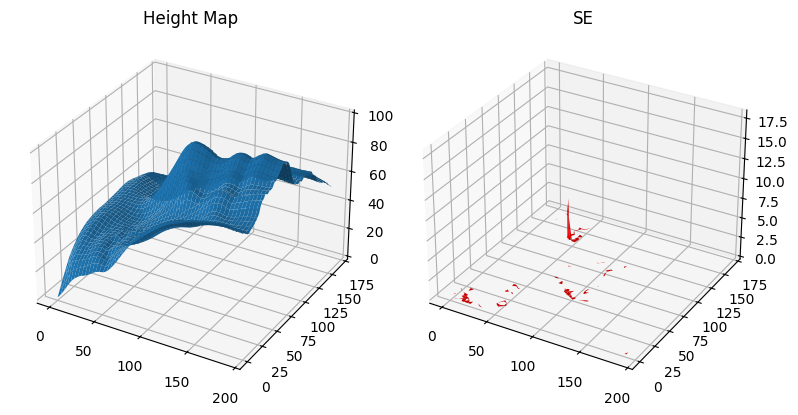

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 572

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


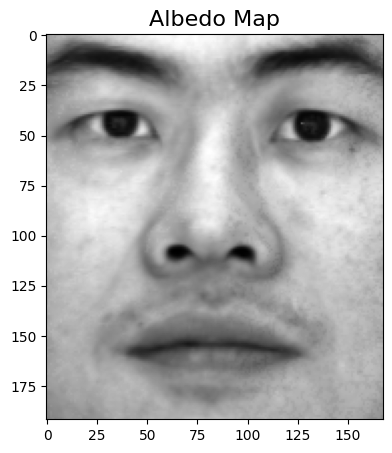

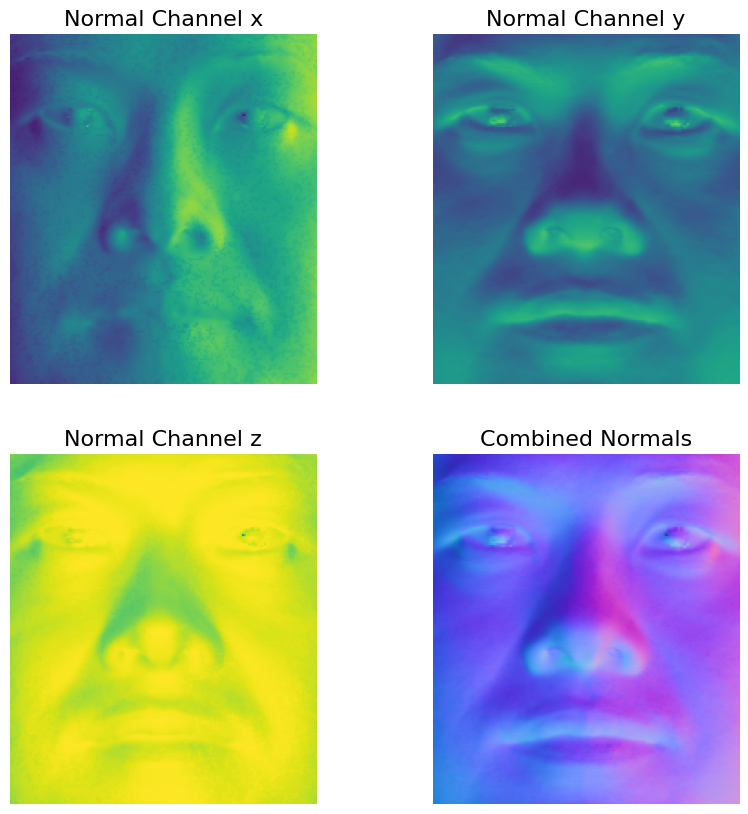

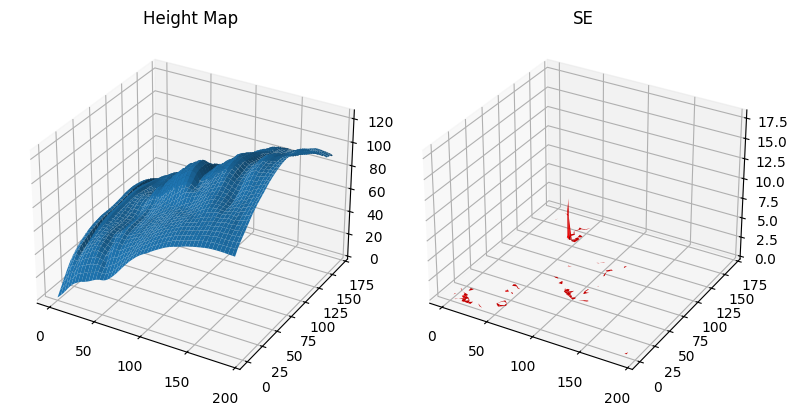

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 572

Computing surface height map...

Displaying results...

Albedo shape: (192, 168)


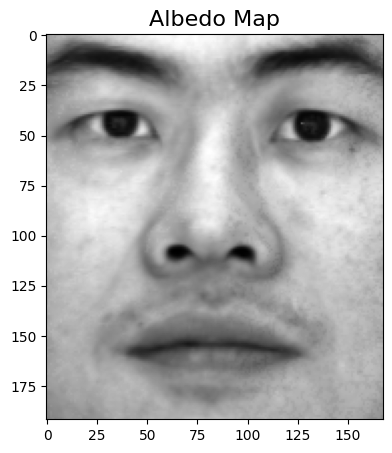

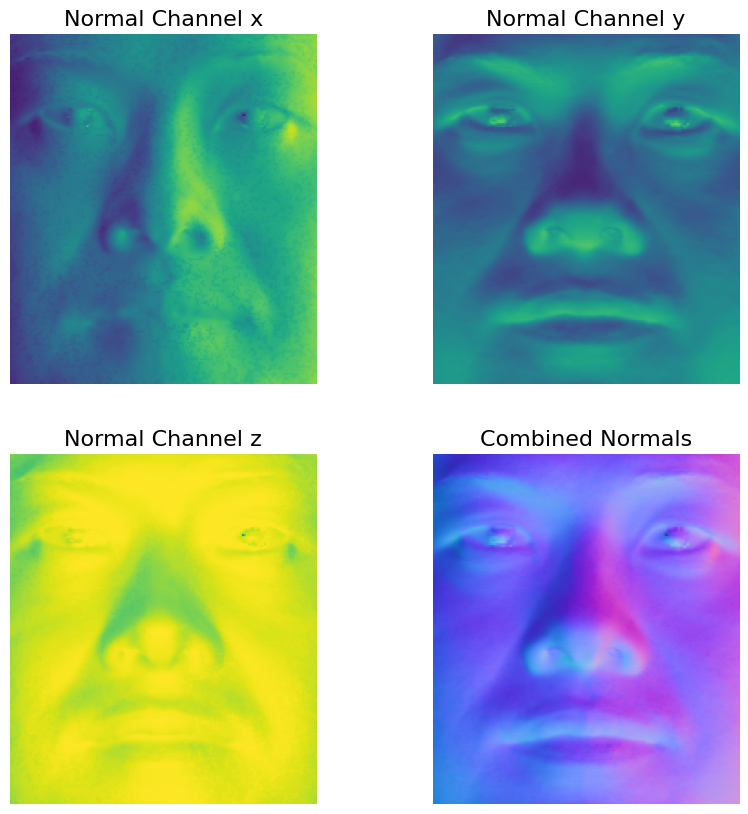

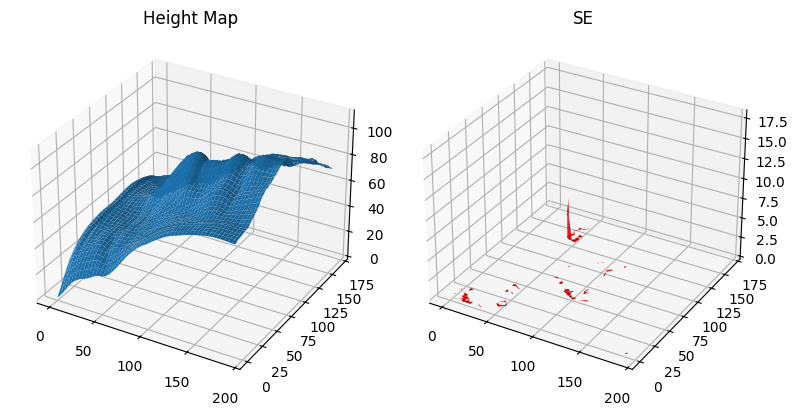

In [47]:
# YOUR CODE HERE

#row
photometric_stereo_face_filtered(path_type='row', bad_images=bad_images)
#column
photometric_stereo_face_filtered(path_type='column', bad_images=bad_images)
#average
photometric_stereo_face_filtered(path_type='average', bad_images=bad_images)

<a id="question-35"></a>
#### <font color='#FF0000'>Question 35 (1 point)</font>

Discuss the results obtained after removing the problematic images. What are the differences in the results, and how do they compare to the original results?

##### <font color='yellow'>Answer:</font>

The results with the problematic images included and with them removed are quite similar.
It is important to note that we only removed a subset of the problematic images, and the original function samples randomly from all available images. This random sampling introduces some variability and helps make the differences less pronounced, thanks to the robustness of the sampling process.

In theory, removing images with strong shadows or reflections should produce a smoother and more reliable depth map. Because strong shadow / reflection images can distort the true surface information, so filtering them out helps the algorithm focus on the real geometry. The effect would likely be more noticeable on a noisier or more challenging dataset, where shadows and reflections occur more frequently.

<a id="question-36"></a>
#### <font color='#FF0000'>Question 36 (4 points)</font>

Now, it's time to apply the algorithm to the Apple dataset using real-world 3-channel RGB inputs.

For the Apple dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Use the images in the "Apple" folder. The `load_apple_images` function is provided as a helper. You should complete the `photometric_stereo_apple_dataset` function as part of this task.

Observe and discuss the results for different integration paths. You may encounter difficulties using this non-synthetic dataset—try if filtering may help.

Make sure to display the results using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

In [48]:
def load_apple_images(image_dir='./photometrics_images/Apple'):
    """
    Loads a set of apple images from the Apple dataset and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Apple images. Defaults to './photometrics_images/Apple/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with only the red channel extracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    # define the number of images to load
    num_images = 99
    
    # load a sample image to determine its dimensions
    filename = os.path.join(image_dir, 'I_0000.png')
    try_image = cv2.imread(filename, -1)
    
    # get the height and width of the sample image
    h, w = try_image[:,:,0].shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the Apple dataset
    d = glob.glob(os.path.join(image_dir, 'I_00*.png'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths and their corresponding indices
    filenames = [os.path.basename(x) for x in d]
    filenames_idx = [int(i.split('_')[1].split('.')[0]) for i in filenames]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # load the image and extract the red channel (index 2)
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1)[:,:,2]

    # read light direction vectors from the provided file
    with open('./photometrics_images/Apple/light_directions_refined.txt') as file:
        lines = [line.split() for line in file]
        x, y, z = [], [], []
        
        # extract light directions corresponding to the selected images
        for idx in filenames_idx:
            x.append(float(lines[idx][0]))
            y.append(float(lines[idx][1]))
            z.append(float(lines[idx][2]))

    # combine the direction vectors, adjusting for normal direction
    scriptV = [1,-1,1] * np.array([x,y,z]).transpose(1,0)

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack < 0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [49]:
def photometric_stereo_apple_dataset(image_dir='./photometrics_images/Apple/', path_type='average'):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Apple Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './photometrics_images/Apple/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_apple_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)
    #print(image_stack.shape)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    # YOUR CODE HERE
    albedo_rgb, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=False)
    

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    p, q, SE = check_integrability(normals)
    
    # YOUR CODE HERE
    mu, sigma = np.nanmean(SE), np.nanstd(SE)
    threshold = mu + 2.0 * sigma if np.isfinite(mu) and np.isfinite(sigma) else 0.01
    
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')
    height_map = construct_surface(p, q, path_type=path_type)
    

    # YOUR CODE HERE

    # show results
    print('Displaying results...\n')

    # YOUR CODE HERE
    show_results(albedo_rgb, normals, height_map, SE)

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 1 minute.

Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 3775

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


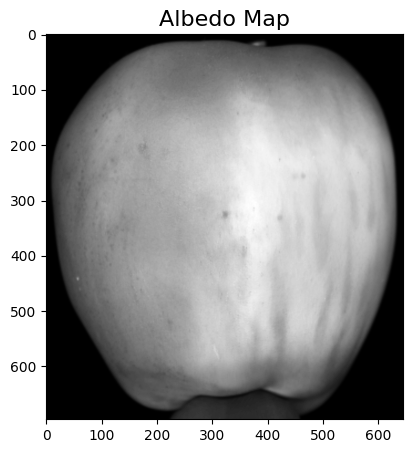

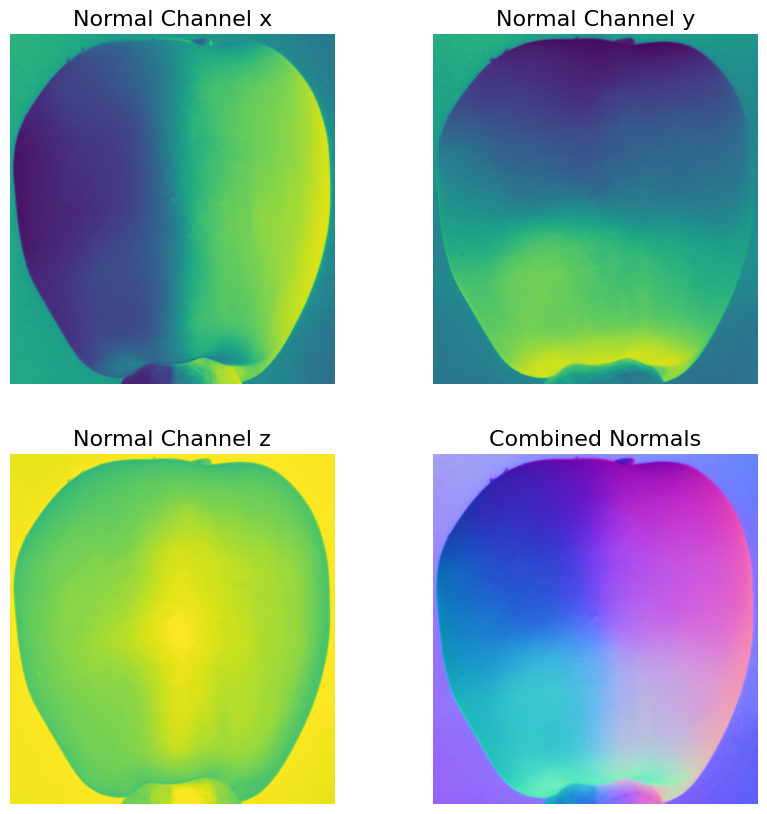

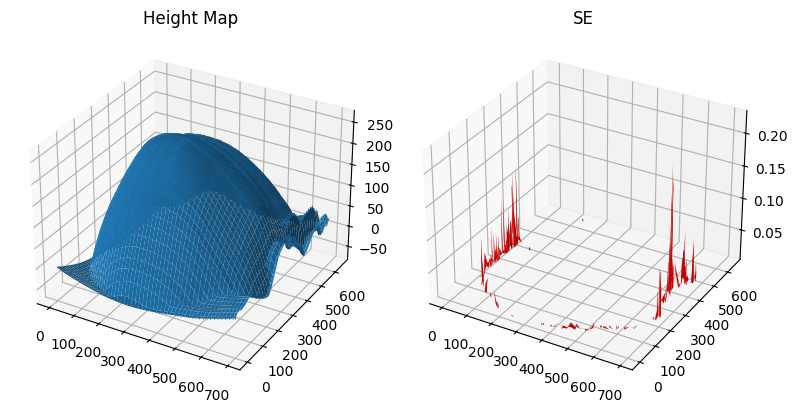

Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 3775

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


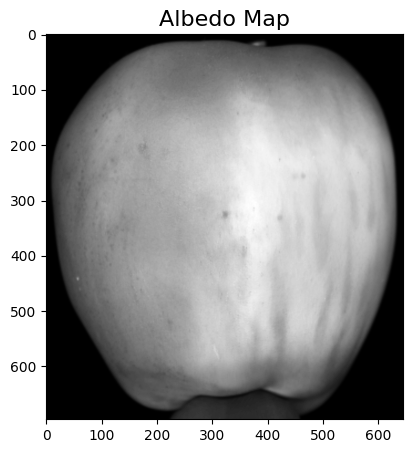

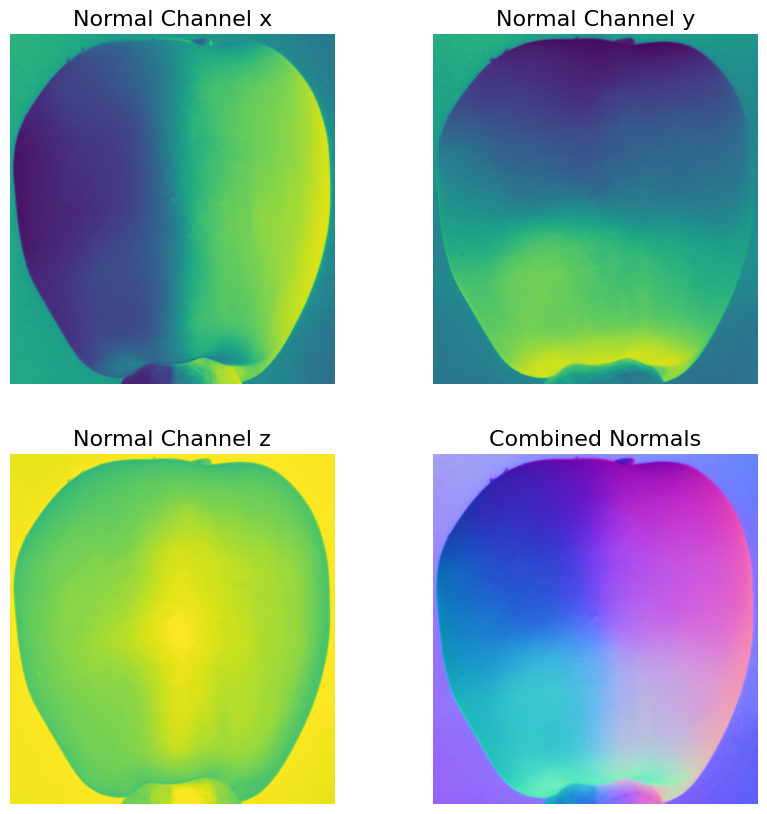

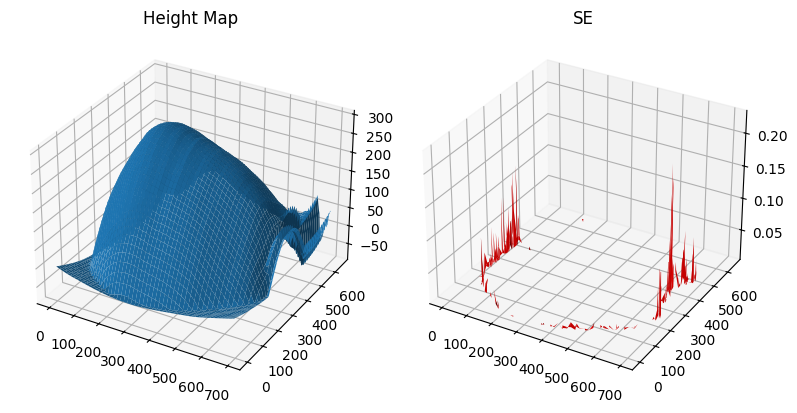

Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 3775

Computing surface height map...

Displaying results...

Albedo shape: (696, 646)


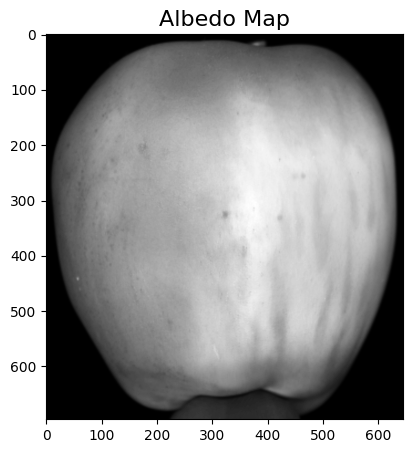

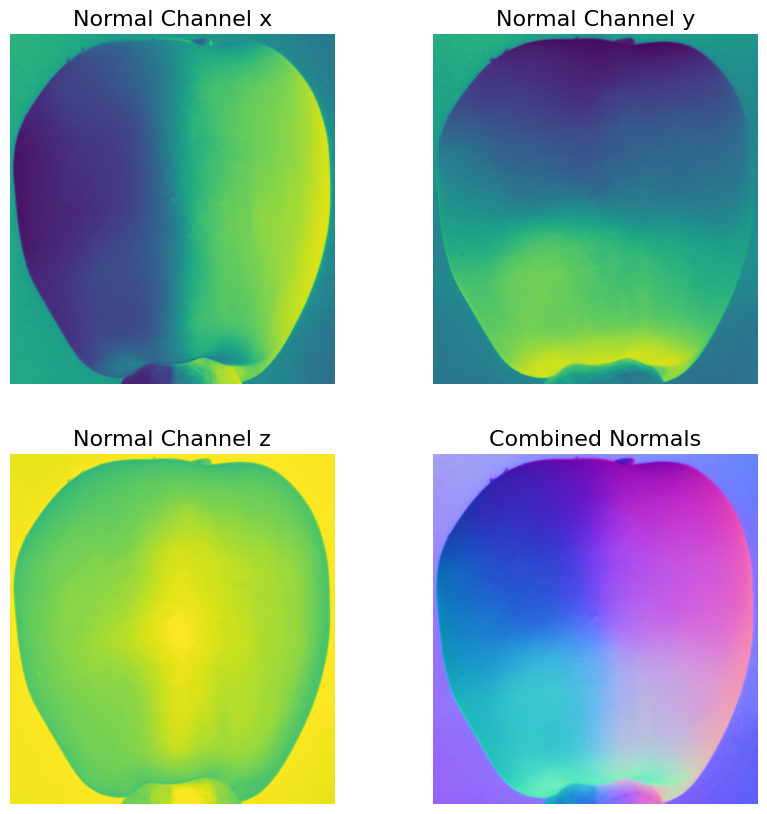

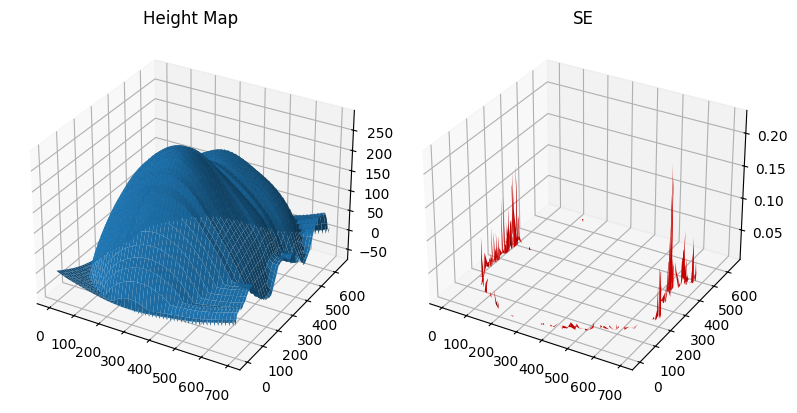

In [50]:
# YOUR CODE HERE

photometric_stereo_apple_dataset()
photometric_stereo_apple_dataset(path_type='column')
photometric_stereo_apple_dataset(path_type='row')

<a id="question-37"></a>
#### <font color='#FF0000'>Question 37 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_apple_dataset` function.

##### <font color='yellow'>Answer:</font>

>The three integration paths give slightly different height maps and surface reconstructions. The average method looks the most balanced and smooth, since it combines information from all directions. The row and column methods show some distortions or bias along their integration direction (for example stretched or tilted shapes). This happens because errors accumulate differently depending on the chosen path. Overall, the average path usually gives the most stable result.

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
|  1| 25 % | 50 % | 25 % |
|  2| 25 % | 50 % | 25 % |
|  3| 50% | - % | 50 % |
|  | - % | - % | - % |

### - End of Notebook -